# Energy Fraud Detection: Exploratory Data Analysis

Imports for notebook:

In [1]:
import hashlib
import numpy as np
import pandas as pd
from scipy.signal import medfilt
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.patches import Rectangle
import seaborn as sns
%matplotlib inline

#from itables import init_notebook_mode
#init_notebook_mode(all_interactive=True)

## Introduction

Looking at dataset of clients and their energy usage over time. The target variable is fraud, and is labelled on a per-client basis.

This is an interesting problem where data is partially corrupted, and has major inconsistencies. Furthermore, there is insufficient information to obtain target variable for all cases.

This notebook conducts the exploratory data analysis, post-cleaning. *This notebook is NOT focussed specifically on fraud detection!* That will be explored in the final section: ____. Use of the test data will be kept to a minimum, even for the purpose simply EDA.

Please refer to the main notebook, "???", for further details and continuation.

Going to use following acronyms:
* MTx: 'mtr_tariff' == x
* MSx: 'mtr_status' == x
* MCx: 'mtr_code' == x
* MNx: 'mtr_notes' == x

### Data Structure and Hierarchy
The figure below was developed via data inspection is explained in more detail in ____. Based on this, different relationships can be explored.

C:\Users\mhoss\AppData\Local\Temp\ipykernel_22148\3041891425.py:58: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


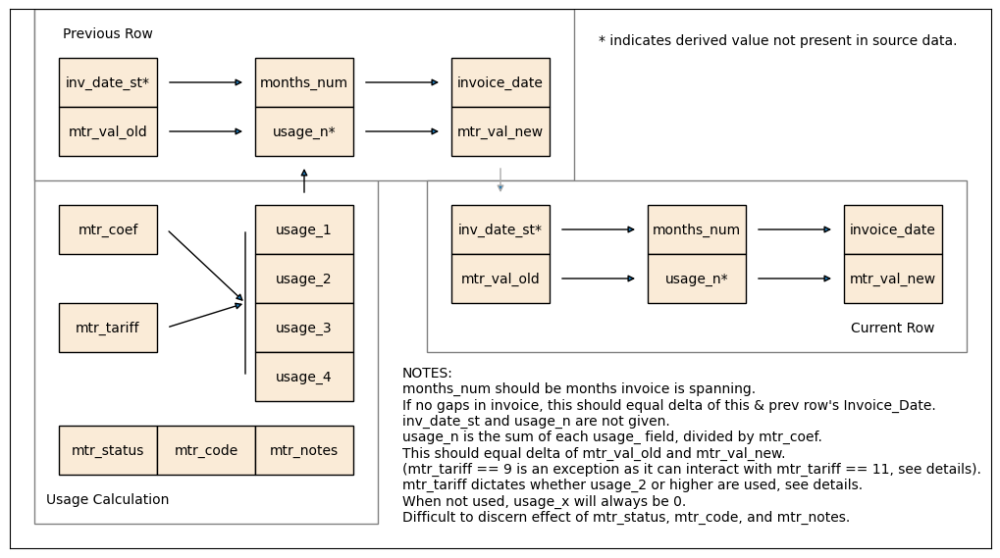

In [2]:
def Plot_FlowChart():
    fig = plt.figure(figsize=(10, 5.5))
    ax = fig.add_axes((0, 0, 1, 1))
    ax.set_xlim(0, 10)
    ax.set_ylim(0, 5.5)
    ax.tick_params(bottom=False, top=False, left=False, right=False)
    ax.tick_params(labelbottom=False, labeltop=False, labelleft=False, labelright=False)


    blocks = [(0.5, 4.5), (2.5, 4.5), (4.5, 4.5), (0.5, 4.0), (2.5, 4.0), (4.5, 4.0), (4.5, 3.0), (6.5, 3.0), (8.5, 3.0),
              (4.5, 2.5), (6.5, 2.5), (8.5, 2.5), (2.5, 3.0), (2.5, 2.5), (2.5, 2.0), (2.5, 1.5), (0.5, 3.0), (0.5, 2.0), 
              (0.5, 0.75), (1.5, 0.75), (2.5, 0.75)]
    texts = ["inv_date_st*", "months_num", "invoice_date", "mtr_val_old", "usage_n*", "mtr_val_new",
             "inv_date_st*", "months_num", "invoice_date", "mtr_val_old", "usage_n*", "mtr_val_new",
             "usage_1", "usage_2", "usage_3", "usage_4", "mtr_coef", "mtr_tariff", "mtr_status", "mtr_code", "mtr_notes"]

    ax.add_patch(Rectangle((0.25, 0.25), 3.5, 5.5, facecolor='white', edgecolor='grey'))
    ax.text(1.0, 0.50, "Usage Calculation", horizontalalignment="center", verticalalignment="center", color="black")
    ax.add_patch(Rectangle((0.25, 3.75), 5.5, 1.75, facecolor='white', edgecolor='grey'))
    ax.text(1.0, 5.25, "Previous Row", horizontalalignment="center", verticalalignment="center", color="black")
    ax.add_patch(Rectangle((4.25, 2.0), 5.5, 1.75, facecolor='white', edgecolor='grey'))
    ax.text(9.0, 2.25, "Current Row", horizontalalignment="center", verticalalignment="center", color="black")

    ax.text(4.0, 0.25,
        "\n".join(["NOTES:",
                  "months_num should be months invoice is spanning.",
                  "If no gaps in invoice, this should equal delta of this & prev row's Invoice_Date.",
                  "inv_date_st and usage_n are not given.",
                  "usage_n is the sum of each usage_ field, divided by mtr_coef.",
                  "This should equal delta of mtr_val_old and mtr_val_new.",
                  "(mtr_tariff == 9 is an exception as it can interact with mtr_tariff == 11, see details).",
                  "mtr_tariff dictates whether usage_2 or higher are used, see details.",
                  "When not used, usage_x will always be 0.",
                  "Difficult to discern effect of mtr_status, mtr_code, and mtr_notes."]),
        horizontalalignment="left", verticalalignment="bottom", color="black")
    
    ax.text(6.0, 5.25, "* indicates derived value not present in source data.",
            horizontalalignment="left", verticalalignment="top", color="black",)

    for i, block in enumerate(blocks):
        ax.add_patch(Rectangle(block, 1.0, 0.5, facecolor='antiquewhite', edgecolor='black'))
        ax.text(block[0] + 0.5, block[1] + 0.25, texts[i], horizontalalignment="center", verticalalignment="center", color="black")

    ax.annotate(text="", xytext=(1.6, 4.75) , xy=(2.4, 4.75), arrowprops=dict(arrowstyle = "-|>", edgecolor='black'))
    ax.annotate(text="", xytext=(1.6, 4.25) , xy=(2.4, 4.25), arrowprops=dict(arrowstyle = "-|>", edgecolor='black'))
    ax.annotate(text="", xytext=(3.6, 4.75) , xy=(4.4, 4.75), arrowprops=dict(arrowstyle = "-|>", edgecolor='black'))
    ax.annotate(text="", xytext=(3.6, 4.25) , xy=(4.4, 4.25), arrowprops=dict(arrowstyle = "-|>", edgecolor='black'))
    ax.annotate(text="", xytext=(5.6, 3.25) , xy=(6.4, 3.25), arrowprops=dict(arrowstyle = "-|>", edgecolor='black'))
    ax.annotate(text="", xytext=(5.6, 2.75) , xy=(6.4, 2.75), arrowprops=dict(arrowstyle = "-|>", edgecolor='black'))
    ax.annotate(text="", xytext=(7.6, 3.25) , xy=(8.4, 3.25), arrowprops=dict(arrowstyle = "-|>", edgecolor='black'))
    ax.annotate(text="", xytext=(7.6, 2.75) , xy=(8.4, 2.75), arrowprops=dict(arrowstyle = "-|>", edgecolor='black'))
    ax.annotate(text="", xytext=(1.6, 3.25) , xy=(2.4, 2.50), arrowprops=dict(arrowstyle = "-|>", edgecolor='black'))
    ax.annotate(text="", xytext=(1.6, 2.25) , xy=(2.4, 2.50), arrowprops=dict(arrowstyle = "-|>", edgecolor='black'))
    ax.annotate(text="", xytext=(2.4, 1.75) , xy=(2.4, 3.25), arrowprops=dict(arrowstyle = "-", edgecolor='black'))
    ax.annotate(text="", xytext=(3.0, 3.60) , xy=(3.0, 3.90), arrowprops=dict(arrowstyle = "-|>", edgecolor='black'))
    ax.annotate(text="", xytext=(5.0, 3.90) , xy=(5.0, 3.60), arrowprops=dict(arrowstyle = "-|>", edgecolor='darkgrey'))

    fig.show()

Plot_FlowChart()

In [3]:
# This will change depending on context, but is the generic grouping to order rows.
grp_cols = ['client_id', 'mtr_type', 'mtr_tariff', 'mtr_id'] # Then to be sorted by: 'invoice_date'

### Data Import and Cleansing

As discussed, this is explained in the ______ notebook. The resulting datasets can either be imported directly (as done here), or calculated using the *unexplained* code below. The code is simply a consolidation of what was discussed in ____ notebook, made generic for any inputted dataset (to allow test set to be input).

In [4]:
# Read the CSV files
df_client_train = pd.read_csv('./client_train.csv', on_bad_lines='skip', low_memory=False)
df_train = pd.read_csv('./df_train.csv', index_col=0, on_bad_lines='skip', low_memory=False)
df_issues_train = pd.read_csv('./df_issues_train.csv', index_col=0, on_bad_lines='skip', low_memory=False)
df_removed_train = pd.read_csv('./df_removed_train.csv', index_col=0, on_bad_lines='skip', low_memory=False)

In [5]:
# Going to stitch back together:
df_train = df_train.join(df_client_train.set_index('client_id'), on='client_id', validate='m:1').copy()
df_train = df_train.join(df_issues_train.set_index('idx'), on='idx', validate='1:1').copy()
col_names = df_issues_train.columns[1:] # fillna with 0
df_train[col_names] = df_train[col_names].fillna(0)
df_train[col_names] = df_train[col_names].astype(int)
del df_client_train, df_issues_train
# Rename columns
rename_dict = {'disrict' : 'district', 
               'client_catg' : 'client_type',
               'creation_date' : 'start_date', 
               'target' : 'fraud'}
df_train.rename(columns=rename_dict, inplace=True)

In [6]:
# Fix date formats
df_train['invoice_date'] = pd.to_datetime(df_train['invoice_date']) # date [YYYY-MM-DD] -> [YYYY-MM-DD]
df_train['start_date'] = pd.to_datetime(df_train['start_date'], dayfirst=True) # date [DD/MM/YYYY] -> [YYYY-MM-DD]

In [7]:
df_train.head()

,client_id,invoice_date,mtr_tariff,mtr_id,mtr_status,mtr_code,mtr_notes,mtr_coef,usage_1,usage_2,...,usage_flag,usage_n_aux_flag,mtr_overlap_bkd,mtr_overlap_fwd,mtr_old_rollover,mtr_new_rollover,mtr_old_adj_quant,mtr_new_adj_quant,months_num_adj,bad_monthly_cap
0,train_Client_0,2005-10-17,11,1335667,0,203,6,1.0,124,0,...,0,0,0,0,0,0,0,0,0,0
1,train_Client_0,2006-02-24,11,1335667,0,203,6,1.0,141,0,...,0,0,0,0,0,0,0,0,0,0
2,train_Client_0,2006-06-23,11,1335667,0,203,6,1.0,162,0,...,0,0,0,0,0,0,0,0,0,0
3,train_Client_0,2006-10-18,11,1335667,0,203,6,1.0,159,0,...,0,0,0,0,0,0,0,0,0,0
4,train_Client_0,2007-02-26,11,1335667,0,203,6,1.0,182,0,...,0,0,0,0,0,0,0,0,0,0


## Energy Usage (1 of 2)
Arguably, energy usage is the primary data available. The other fields can be treated as context. This Section focusses solely on per-account energy usage and not aggregates.

Data usage can be measured in several methods:
* 'mtr_val': ('mtr_val_old' and 'mtr_val_new')
* 'usage_n': (sum('usage_1', 'usage_2', 'usage_3', 'usage_4') / 'mtr_coef')
* 'monthly_usage': ('usage_n' / 'months_num')
* 'per_month_usage': ('monthly_usage' * 'duration')

Each will be briefly showcased and discussed:

### Calculate Usage:
'Calc_Usage()' function is from the __ notebook, and described there. Going to calculate 'monthly_usage' and 'usage_n'.

In [8]:
def Calc_Usage(df_train):
    df_train['usage_N'] = df_train.loc[:, ['usage_1', 'usage_2', 'usage_3', 'usage_4']].sum(axis=1)
    df_train['usage_n'] = (df_train['usage_N'] / df_train['mtr_coef']).round(0)
    df_train['monthly_usage'] = df_train['usage_n'].div(df_train['months_num'])
    df_train['monthly_usage_aux'] = df_train['usage_aux'].div(df_train['months_num'])
    df_train['usage_n_aux'] = df_train['usage_n'] + (df_train['usage_aux']*((df_train['usage_aux_flag'] == 1).astype(int)))
    # Calculating derived metrics:
    df_train['usage_n_calc'] = df_train['mtr_val_new'] - df_train['mtr_val_old']
    df_train['usage_aux_calc'] = df_train['usage_n_calc'] - df_train['usage_n']
    df_train['mtr_coef_calc'] = (df_train['usage_N'] / df_train['usage_n_calc']).round(1)
    df_train['mtr_val_new_calc'] = df_train['mtr_val_old'] + df_train['usage_n'].round(0)
    df_train['mtr_val_old_calc'] = df_train['mtr_val_new'] - df_train['usage_n'].round(0)
    return df_train
df_train = Calc_Usage(df_train)

### 'mtr_val'
* The field 'mtr_val_new' is the meter reading at 'invoice_date'.
* This can be tracked across invoices to track usage.

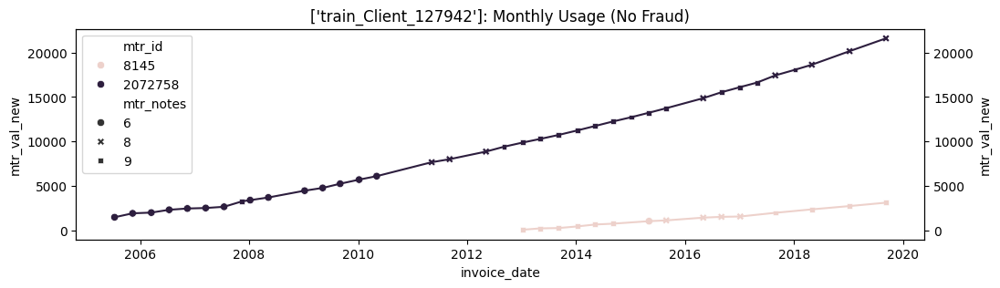

In [9]:
def Plot_Usage_Stat(df, col_name, red_col_name):
    name  = df['client_id'].unique()
    fraud = df['fraud'].unique()
    fig, ax1 = plt.subplots(figsize=(12,3))
    ax2 = ax1.twinx()
    ax1.set_title(f"{name}: Monthly Usage ({"No Fraud" if fraud == 0 else "Fraud"})")
    sns.scatterplot(data=df, x='invoice_date', y=col_name, hue='mtr_id', style='mtr_notes', markers=True, ax=ax1)
    sns.lineplot(data=df, x='invoice_date', y=col_name, hue='mtr_id', ax=ax2, legend=False)
    if red_col_name is not None:
        sns.scatterplot(data=df, x='invoice_date', y=red_col_name, color='red', style='mtr_notes', markers=True, ax=ax2, legend=False)
Plot_Usage_Stat(df_train[(df_train['client_id'] == 'train_Client_127942')].copy(), col_name='mtr_val_new', red_col_name=None)

This is a very simple plot, but requires some effort to interpret by the reader. The actual usage is determined by the delta between two points. This calculation is made slightly more difficult by the fact the periods between invoices differ.

There is also another metric not visible here of "missing" usage:
* "missing" usage is not necessarily fraud, but simply usage that is not directly accounted for.
* In the case of 'mtr_val', it would be where 'mtr_val_new_prv' != 'mtr_val_old', indicated usage between two invoices.
* This might be due to a missing invoice, either due partial dataset, or removed during data cleaning steps.
* It may also be due to meter resetting, or other unknown reason(s).
* If there is a gap between two invoices, the "missing" usage could reasonably be allocated in that period.
* Sometimes, there is no clear gap between invoices. This may at times be simply be due to the coarseness of 'months_num'.
* If there is no gap between invoices, it is unclear where to allocate the "missing" usage. 

Going to calculate the start date for an invoice based on 'invoice_date' - 'months_num':

In [10]:
df_train['invoice_date_prv'] = df_train.groupby(grp_cols,observed=True)['invoice_date'].shift(1)
df_train['mtr_val_new_prv'] = df_train.groupby(grp_cols,observed=True)['mtr_val_new'].shift(1)
df_train['usage_gap'] = (df_train['mtr_val_new'] - df_train['mtr_val_new_prv']) - df_train['usage_n_aux'] # gap in usage, presumably in 'months_gap'
df_train['months_gap'] = ((df_train['invoice_date'] - df_train['invoice_date_prv']).dt.days.values / 30.5).round(1) - df_train['months_num']
df_train.loc[df_train['months_gap'] < 0, 'months_gap'] = 0 # do not allow overlaps (negatives) for now
df_train['monthly_gap'] = df_train['usage_gap'].div(df_train['months_gap'])
df_train['temp_1'] = df_train['invoice_date'] - pd.to_timedelta(df_train['months_num']*30.5, unit="D") # should be start

'Gen_Mtr_Val()' function generates alternative data format that contains a distinct row for each 'mtr_val_old' and 'mtr_val_new'. The value is placed into 'mtr_val'. It also populates 'mtr_val_missing', the unexplained jumps in meter values in between invoices. This is plotted in 'Plot_Mtr_Val', with the "missing" usage highlighted in red.

In [12]:
def Gen_Mtr_Val(df):
    col_names = ['client_id', 'invoice_date', 'mtr_tariff', 'mtr_id', 'mtr_status', 'mtr_code', 'mtr_notes', 'months_num', 'mtr_val_old', 'mtr_val_new',
                        'district', 'client_type', 'region', 'start_date', 'fraud', 'temp_1', 'monthly_usage', 'monthly_gap', 'usage_gap', 'months_gap']
    df_temp = df[col_names].copy()
    df_temp = df_temp.loc[df_temp.index.repeat(2)].reset_index(drop=True) # Duplicate every row. Have one for start_val, one for end_val 
    df_temp['start_offset'] = df_temp.groupby(['client_id', 'mtr_tariff', 'mtr_id', 'mtr_code', 'invoice_date'], observed=True).cumcount() # this starts at 0 for some reason...
    mask = (df_temp['start_offset'] == 0)
    df_temp.loc[mask,'invoice_date'] = df_temp.loc[mask,'invoice_date'] - pd.to_timedelta((df_temp.loc[mask,'months_num'])*30.5, unit='days')
    df_temp['mtr_val'] = 0
    df_temp.loc[mask,'mtr_val'] = df_temp.loc[mask,'mtr_val_old']
    df_temp.loc[~mask,'mtr_val'] = df_temp.loc[~mask,'mtr_val_new']
    df_temp['mtr_val_type'] = 'mtr_val_old'
    df_temp.loc[~mask,'mtr_val_type'] = 'mtr_val_new'
    # Storing where there is unexplained jump in meter values
    df_temp['mtr_val_missing'] = 0
    mask = (df_temp['monthly_gap'] > 0) & (df_temp['mtr_val_type'] == 'mtr_val_old')
    df_temp.loc[mask,'mtr_val_missing'] = df_temp.loc[mask,'mtr_val_old']
    df_temp['temp_2'] = df_temp.groupby(['client_id', 'mtr_tariff', 'mtr_id', 'mtr_code'], observed=True)['mtr_val_missing'].shift(-1) # shift back one row
    mask = (df_temp['temp_2'] != 0) & (df_temp['mtr_val_type'] == 'mtr_val_new')
    df_temp.loc[mask,'mtr_val_missing'] = df_temp.loc[mask,'mtr_val_new']
    mask = (df_temp['mtr_val_missing'] == 0)
    df_temp.loc[mask,'mtr_val_missing'] = np.nan
    return df_temp
df_temp = Gen_Mtr_Val(df_train)

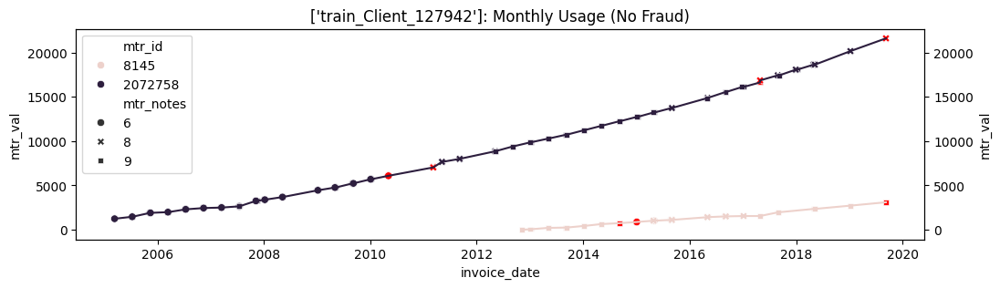

In [13]:
Plot_Usage_Stat(df_temp[(df_temp['client_id'] == 'train_Client_127942')].copy(), col_name='mtr_val', red_col_name='mtr_val_missing')

Ultimately, this view still does not address the shortcomings in interpretability of relevant metrics (e.g. actual usage quantities).

### 'usage_n'
* The sum of 'usage_1' -> 'usage_4', scaled appropriately with 'mtr_coef'.
* This gives the amount of energy usage for the given record.
* 'usage_n_aux' can also be used if wishing to aggregate MT9 and MT11 where applicable. This is skipped for simplicity here.

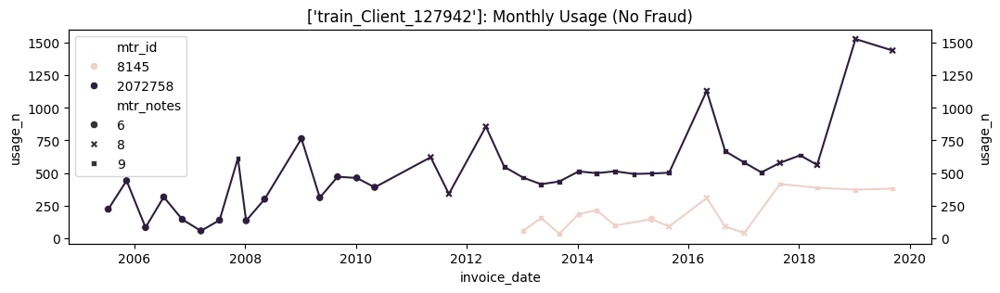

In [14]:
Plot_Usage_Stat(df_train[(df_train['client_id'] == 'train_Client_127942')].copy(), col_name='usage_n', red_col_name=None)

* The record is marked by the end date 'invoice_date'.
* The duration the record spans is given by the field 'months_num', which would be substracted from 'invoice_date' to give effective starting date of invoice.
* This means that the usage across different invoices may span different durations of time.

Furthermore, the "missing" usage is once again not represented here.

### 'monthly_usage'
* One simple work-around is to divide 'usage_n' by 'months_num' to give 'monthly_usage'.
* This provides a better like-for-like comparison between invoices.

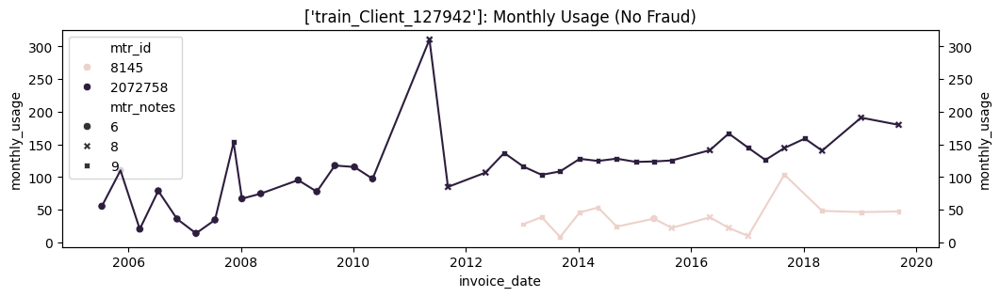

In [15]:
Plot_Usage_Stat(df_train[(df_train['client_id'] == 'train_Client_127942')].copy(), col_name='monthly_usage', red_col_name=None)

   * However, this means there is still only one record for a given invoice, which may span varying durations.
   * This means the record would only be recorded once at its end date ('invoice_date').
   * "Missing" usage is also not represented here.

### 'per_month_usage'
* Going to create an alternative format that records 'usage_n' on a monthly basis.
* This will mean duplicated rows to ensure each month is represented individually with appropriate usage.
* Assuming that usage throughout a given invoice period can be distributed equally.
* "Missing" usage will be allocated in gaps between invoices if present, otherwise, distributed equally on top of invoice if not.

'Gen_Per_Month_Usage()' function generates the described format. One issue with this is it greatly expands for number of rows (~5x the size!).

In [16]:
def Gen_Per_Month_Usage(df):
    # Looking to create a row per-month variant: Looking at normal usage
    col_names = ['client_id', 'invoice_date', 'mtr_tariff', 'mtr_id', 'mtr_status', 'mtr_code', 'mtr_notes', 'months_num', 'mtr_type',
                        'district', 'client_type', 'region', 'start_date', 'fraud', 'temp_1', 'monthly_usage', 'monthly_gap', 'usage_gap', 'months_gap']
    df_temp = df[col_names].copy()
    df_temp = df_temp.loc[df_temp.index.repeat(df_temp['months_num'])].reset_index(drop=True) # Repeat for each months_num, will now have many duplicates
    df_temp['month_offset'] = df_temp.groupby(['client_id', 'mtr_tariff', 'mtr_id', 'mtr_code', 'invoice_date'], observed=True).cumcount() # this starts at 0 for some reason...
    df_temp['invoice_date'] = df_temp['invoice_date'] - pd.to_timedelta((df_temp['month_offset'])*30.5, unit='days')
    df_temp['invoice_month'] = df_temp.loc[:, 'invoice_date'].dt.to_period('M').dt.to_timestamp()
    df_temp['monthly_gap'] = np.nan # Do not want to double-count
    # Looking to create a row per-month variant: Looking at gap in usage
    mask = (df['monthly_gap'] > 0) & (df['months_gap'] > 0) # only look at those that have some thing and some time to put into.
    df_2 = df_train.loc[mask, col_names].copy()
    df_2['month_offset'] = df_2.loc[:, 'months_num'] - 1
    df_2 = df_2.loc[df_2.index.repeat(np.ceil(df_2['months_gap']))].reset_index(drop=True) # Repeat for each months_num, will now have many duplicates
    df_2['month_gap_offset'] = df_2.groupby(['client_id', 'mtr_tariff', 'mtr_id', 'mtr_code', 'invoice_date'], observed=True).cumcount()
    df_2['month_gap_offset'] = df_2.loc[:, 'month_gap_offset'] + 1
    df_2['invoice_date'] = (df_2['invoice_date'] - pd.to_timedelta((df_2['month_offset'])*30.5, unit='days')) - pd.to_timedelta((df_2['month_gap_offset'])*30.5, unit='days')
    df_2['invoice_month'] = df_2.loc[:, 'invoice_date'].dt.to_period('M').dt.to_timestamp()
    mask = (df_2['months_gap'] - df_2['month_gap_offset']) < 0
    df_2.loc[mask, 'monthly_gap'] = df_2.loc[mask, 'monthly_gap'] * (df_2.loc[mask, 'month_gap_offset'] - df_2.loc[mask, 'months_gap']) # Shrink usage for those not spanning whole month (months_num was always whole number)
    df_2['monthly_usage'] = np.nan # Do not want to double-count
    df_temp = pd.concat([df_temp, df_2]).reset_index()
    # Looking to create a row per-month variant: Looking at gap in usage with no gap in time
    mask = (df['usage_gap'] > 0) & (df['months_gap'] == 0) # These had nowhere to put them: will overlap with existing bill
    df_2 = df_train.loc[mask, col_names].copy()
    df_2['monthly_gap'] = df_2['usage_gap'].div(df_train['months_num'])
    df_2 = df_2.loc[df_2.index.repeat(df_2['months_num'])].reset_index(drop=True) # Repeat for each months_num, will now have many duplicates
    df_2['month_offset'] = df_2.groupby(['client_id', 'mtr_tariff', 'mtr_id', 'mtr_code', 'invoice_date'], observed=True).cumcount() # this starts at 0 for some reason...
    df_2['invoice_date'] = df_2['invoice_date'] - pd.to_timedelta((df_2['month_offset'])*30.5, unit='days')
    df_2['invoice_month'] = df_2.loc[:, 'invoice_date'].dt.to_period('M').dt.to_timestamp()
    df_2['monthly_usage'] = np.nan # Do not want to double-count
    df_temp = pd.concat([df_temp, df_2]).reset_index()
    df_temp = df_temp.drop(columns=['level_0', 'index'])
    return(df_temp)
df_temp = Gen_Per_Month_Usage(df_train)

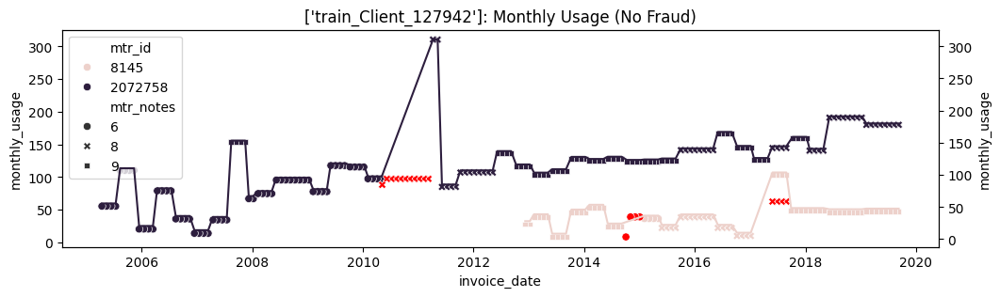

In [17]:
Plot_Usage_Stat(df_temp[(df_temp['client_id'] == 'train_Client_127942')].copy(), col_name='monthly_usage', red_col_name='monthly_gap')

This format seems the clearest. It also effectively highlights how the "missing" usage behaves very differently in different circumstances:
* 2010-2012: There is an unusually high per-month usage, preceded by multiple months on "missing" usage.
  * Redistributing this unusually high per-month usage would "fill" most of the "missing" usage.
* 2014-2015: There is some "missing" usage that is not followed by unusual per-month usage.
  * This indicates that an invoice is perhaps missing.
* 2017-2018: There is some "missing" usage overlapping an invoice (note that this is overlapping with bluw line and *not* beige one!).
  * There is no obvious place to allocate this usage as there are no gaps between invoices.

### Conclusions:
The per-month usage format seems the clearest for viewing usage. However, this is much too granular for general EDA. In this notebook, will be more interested in aggregated usage to determine the influence various fields have on usage. Additionally, splitting the usage into a per-month format has some risks: there may be valuable information held within the number of months an invoice spans, or the specific date it was billed. For example, it is known that certain meter tariffs behaved different after key dates; this is reflected on records based on the 'invoice_date' and cannot be interpolated.

The topic of "missing" usage still remains very nebulous. It seems there are multiple causes, and multiple potentially applicable remedies. For simplicity, "missing" usage will be largely ignored henceforth.

## Shifts over time
The data spans a long time; ~42 years. It is likely certain features or values shift over time. 

Three important dates already identified during data cleaning are:
1. 2005/06/29: Earliest case of Fraud.
2. 2005/07/01: One set of 'monthly_cap' changes to 'mtr_tariff' = 11
3. 2014/01/01: Another set of 'monthly_cap' changes to 'mtr_tariff' = 10|11

There are likely more, and this section will explore this topic.

In [18]:
date_markers = ['2005/06/29 00:00:00', 
                '2005/07/01 00:00:00',
                '2014/01/01 00:00:00']

In [19]:
# Looking at monthly granularity
df_train['invoice_month'] = df_train.loc[:, 'invoice_date'].dt.to_period('M').dt.to_timestamp()

### Invoice Volumes
Looking at the volume of invoices over time:

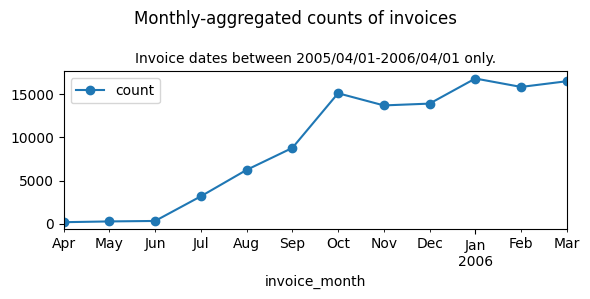

In [9]:
# aggregated monthly
mask = (df_train['invoice_date'] < '2006-04-01 00:00:00') & (df_train['invoice_date'] > '2005-04-01 00:00:00')
df_temp = pd.DataFrame(data = {'invoice_month':pd.date_range(start=df_train.loc[mask, 'invoice_month'].min(), end=df_train.loc[mask, 'invoice_month'].max(), freq="MS")})
df_temp = pd.merge(left=df_temp, right=df_train.loc[mask, 'invoice_month'].value_counts(), on='invoice_month', how="left")
df_temp = df_temp.fillna(0).sort_values(by='invoice_month')
axes = df_temp.plot(x='invoice_month', y='count', marker='o', figsize=(6,3))
plt.suptitle('Monthly-aggregated counts of invoices', fontsize=12)
plt.title('Invoice dates between 2005/04/01-2006/04/01 only.', fontsize=10)
plt.tight_layout()
plt.show()

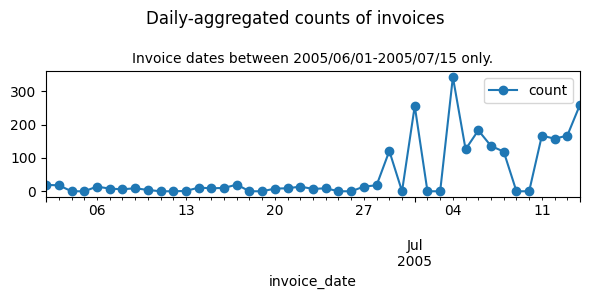

In [10]:
# aggregated daily (this should match data's existing resolution)
mask = (df_train['invoice_date'] < '2005-07-15 00:00:00') & (df_train['invoice_date'] > '2005-06-01 00:00:00')
df_temp = pd.DataFrame(data = {'invoice_date':pd.date_range(start=df_train.loc[mask, 'invoice_date'].min(), end=df_train.loc[mask, 'invoice_date'].max(), freq="D")})
df_temp = pd.merge(left=df_temp, right=df_train.loc[mask, 'invoice_date'].value_counts(), on='invoice_date', how="left")
df_temp = df_temp.fillna(0).sort_values(by='invoice_date')
axes = df_temp.plot(x='invoice_date', y='count', marker='o', figsize=(6,3))
plt.suptitle('Daily-aggregated counts of invoices', fontsize=12)
plt.title('Invoice dates between 2005/06/01-2005/07/15 only.', fontsize=10)
plt.tight_layout()
plt.show()

The volume in invoices over time is a bit unusual. There is a clear divide on 2005/06/28, with almost no invoices prior. Since the invoice date that had an account flagged as fraud was on 2005/06/29, it is assumed in someway connected.

There is also a clear interim period after 2005/06/28 for ~4months where the volume steadily grows before stabilising. This coincides with the most typical 'months_num' and is assumed to be the cause; similar to an edge of a rolling window.

Based on this, will be focussing on data after 2006 after it stabilised.

The 'Plot_Volume_Over_Time()' function is just a wrapper around a stacked area plot that can have the y-axis values and colours set programmatically. Two slight complications:
* It automatically caps number of categories to 9 + "Other" to avoid visual clutter.
* It creates a hash based on the category value to then define its colour for more colour-consistency between plots.

In [11]:
def Plot_Volume_Over_Time(df, group_name, group_filter, sub_group_name, xlim='2005-06-01 00:00:00', date_markers=None):
    def Calc_Colour(value):
        hashed_value = int(hashlib.md5(str(value).encode()).hexdigest(), 16)
        cmap = plt.get_cmap('tab20') # use the colormap to get the color
        return mcolors.rgb2hex(cmap((hashed_value % 1000) / 1000)) # will not need more than 10 colours

    if group_filter is not None:
        mask = (df[group_name] == group_filter)
        metric = sub_group_name
    else:
        mask = (df[group_name] == df[group_name]) # kind of silly...
        metric = group_name
    df_temp = df[mask].groupby(['invoice_month', metric], observed=False).agg(Monthly_Count=('invoice_date', 'count')).reset_index()
    df_temp = df_temp.merge(df[mask].groupby(['invoice_month'], observed=False)['invoice_date'].agg('count').reset_index(), on='invoice_month')
    df_temp = df_temp.rename(columns={'invoice_date':'Monthly_Population_Count'})
    df_temp['Monthly_Percentage'] = (df_temp['Monthly_Count'].div(df_temp['Monthly_Population_Count'])*100).round(1)
    # Want to keep only top 9 most popular categories
    if df_temp[metric].nunique() > 9:
        df_mask = df_temp.groupby(metric)['Monthly_Count'].agg('sum')
        df_mask = df_mask.sort_values(ascending=False)
        df_mask = df_mask[0:(9 if 9 <= len(df_mask) else len(df_mask))]
        df_mask = df_mask.reset_index()
        mask_temp = df_temp[metric].isin(df_mask[metric]) # want to keep these, aggregate the rest
        df_2 = df_temp[~mask_temp].groupby('invoice_month').agg('sum').reset_index()
        df_2[metric] = 'Other'
        df_temp = pd.concat([df_temp[mask_temp],df_2]).reset_index()
        df_temp = df_temp.drop(columns=['index'])
        df_temp = df_temp.sort_values(by=['invoice_month', metric])
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(18, 4), sharey=False)
    # Adding the markers first, converting the date_markers to similar x-axis: may cause some shifting!
    if date_markers is not None:
        date_markers = pd.to_datetime(pd.Series(date_markers)).dt.to_period('M').dt.to_timestamp()
        if xlim is not None:
            date_markers = date_markers[(date_markers >= xlim) & (date_markers <= df_temp['invoice_month'].max())]
        for date_marker in date_markers:
            axes[0].axvline(x = date_marker, color = 'darkgrey')
            axes[1].axvline(x = date_marker, color = 'darkgrey')
    # Doing abs counts first, making sure no gaps
    df_2 = pd.DataFrame(data = {'invoice_month':pd.date_range(start=df_temp['invoice_month'].min(), end=df_temp['invoice_month'].max(), freq="MS")})
    df_2 = pd.merge(left=df_2, right=df_temp.pivot(index='invoice_month', columns=metric, values='Monthly_Count'), on='invoice_month', how="left")
    df_2 = df_2.fillna(0).set_index('invoice_month').sort_index()
    if xlim is not None:
        mask_2 = (df_2.index >= xlim)
        axes[0].stackplot(df_2.index[mask_2], df_2[mask_2].values.T, labels=df_2.columns, colors=[Calc_Colour(value) for value in df_2.columns])
    else:
        axes[0].stackplot(df_2.index, df_2.values.T, labels=df_2.columns, colors=[Calc_Colour(value) for value in df_2.columns])
    axes[0].set_xlabel('Invoice Month', fontsize=12)
    axes[0].set_ylabel('Monthly Count', fontsize=12)
    axes[0].legend(title=metric, bbox_to_anchor=(1.05, 1), loc='upper left')
    # Doing percentage, making sure no gaps
    df_2 = pd.DataFrame(data = {'invoice_month':pd.date_range(start=df_temp['invoice_month'].min(), end=df_temp['invoice_month'].max(), freq="MS")})
    df_2 = pd.merge(left=df_2, right=df_temp.pivot(index='invoice_month', columns=metric, values='Monthly_Percentage'), on='invoice_month', how="left")
    df_2 = df_2.fillna(0).set_index('invoice_month').sort_index()
    if xlim is not None:
        mask_2 = (df_2.index >= xlim)
        axes[1].stackplot(df_2.index[mask_2], df_2[mask_2].values.T, labels=df_2.columns, colors=[Calc_Colour(value) for value in df_2.columns])
    else:
        axes[1].stackplot(df_2.index, df_2.values.T, labels=df_2.columns, colors=[Calc_Colour(value) for value in df_2.columns])
    axes[1].set_xlabel("Invoice Month", fontsize=12)
    axes[1].set_ylabel('Monthly Percentage', fontsize=12)
    axes[1].legend(title=metric, bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.xticks(rotation=45)
    if group_filter is not None:
        plt.title(f"Filtered by {group_name} equal to {group_filter}")
    plt.suptitle(f"Stacked Monthly Count (Left) and Percentage (Right) by {metric} and Month", fontsize=14)
    plt.tight_layout()
    plt.show()

The first set of plots using the function will include whole date range to see what is to be otherwise truncated later. Plots show count of invoices, based on monthly aggregates, divided by energy type.

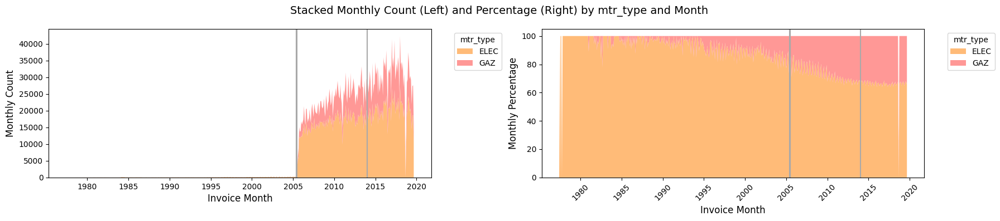

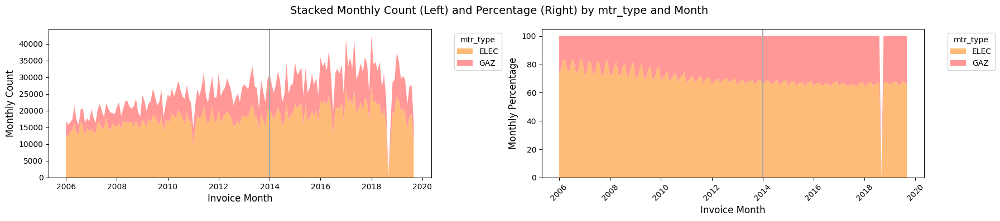

In [12]:
date_mask = '2006-01-01 00:00:00'
col_names = [['mtr_type', None, None, None],
             ['mtr_type', None, None, date_mask]]
for item in col_names:
    Plot_Volume_Over_Time(df=df_train, group_name=item[0], group_filter=item[1], sub_group_name=item[2], xlim=item[3], date_markers=date_markers)

There seems to be a steadily increasing share of gas until ~2015 where it approximately stabilises. The trend is much more noticable prior to 2005 but could easily be sampling bias given the small population in that period. 

There also seems three times where volumes drop by an unusual amount: 2011, 2016/2017, and 2019. These will be investigated shortly.

Looking at a histogram of daily invoice counts:

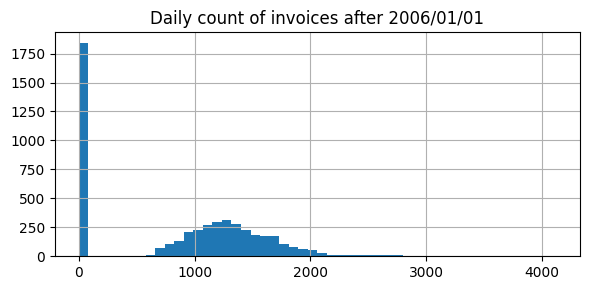

In [13]:
mask = df_train['invoice_date'] > date_mask
df_temp = pd.DataFrame(data = {'invoice_date':pd.date_range(start=df_train.loc[mask, 'invoice_date'].min(), 
                                                            end=df_train.loc[mask, 'invoice_date'].max(), freq="D")})
df_temp = pd.merge(left=df_temp, right=df_train.loc[mask, 'invoice_date'].dt.floor('D').value_counts(), on='invoice_date', how="left")
df_temp = df_temp.fillna(0)
axes = df_temp.hist('count', bins=50, figsize=(6,3))
plt.title('Daily count of invoices after 2006/01/01', fontsize=12)
plt.tight_layout()
plt.show()

Seems reasonable to be expected between ~500 and ~2300 daily counts post 2016. Although there are clearly very many that have counts of 0. 

Looking at the most common days and that these low-volume days occur:

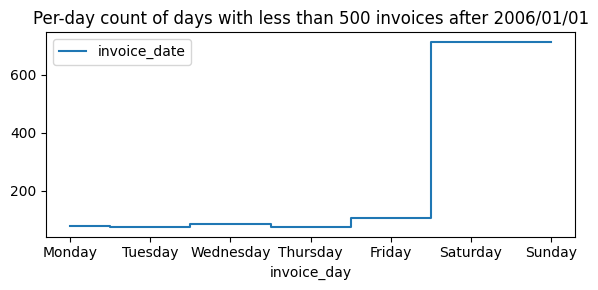

In [14]:
df_temp['invoice_day'] = df_temp['invoice_date'].dt.day_name()
mask = (df_temp['count'] < 500)
axes = (df_temp[mask].groupby('invoice_day')['invoice_date']
        .agg('count').reset_index().set_index('invoice_day')
        .reindex(['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
        .plot(y="invoice_date", drawstyle='steps-mid', figsize=(6,3)))
plt.title('Per-day count of days with less than 500 invoices after 2006/01/01', fontsize=12)
plt.tight_layout()
plt.show()

~77% of days that had less than 500 invoices were on the weekend, and there were no instances of a Saturday or Sunday having more than a count of 500.

Looking at number of consecutive days that have unusually low values:

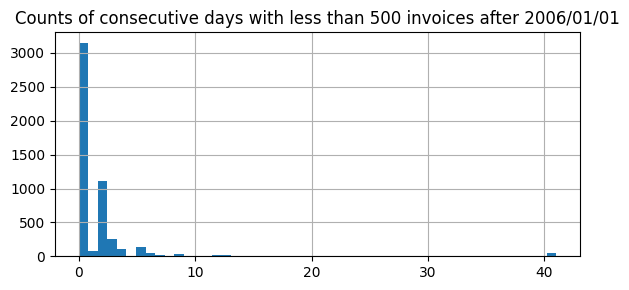

In [15]:
df_temp['count_2'] = (df_temp['count'] < 500).astype(int)
df_temp['count_3'] = ((~df_temp['count_2']) & (df_temp['count_2'] != df_temp['count_2'].shift())).cumsum()
df_temp.loc[df_temp['count_2'] == 0, 'count_3'] = 0
df_temp = df_temp.merge(df_temp[df_temp['count_2'] == 1].groupby('count_3').size().reset_index(), on='count_3', how='left')
df_temp.loc[df_temp['count_2'] == 0, 0] = 0
df_temp[0] = df_temp[0].fillna(0)
axes = df_temp.hist(0, bins=50, figsize=(6,3))
plt.title('Counts of consecutive days with less than 500 invoices after 2006/01/01', fontsize=12)
plt.tight_layout()
plt.show()

#### Interesting Dates Added:
Included top 6 dates that had prolonged gap, from the above, to the previous lists of dates to consider for context of behavioural changes. Also briefly investigated online for attributing a potential cause:
1. 2005/06/29: Earliest case of Fraud.
2. 2005/07/01: One set of 'monthly_cap' changes to 'mtr_tariff' = 11
3. 2011/01/14 - 2011/01/25: 12-day period of low invoices. Substantial political unrest, culminating governmental change in mid-January. [New]
4. 2014/01/01: Another set of 'monthly_cap' changes to 'mtr_tariff' = 10|11
5. 2014/12/27 - 2015/01/04: 9-day period of low invoices. Could not find any potential reason. [New]
6. 2015/05/19 - 2015/05/27: 9-day period of low invoices. Their president visited USA 2015/05/20 - 2015/05/21 (very dubious link). [New]
7. 2016/07/02 - 2016/07/10: 9-day period of low invoices. Could not find any potential reason. [New]
8. 2018/08/31 - 2018/10/10: 41-day period of low invoices. Their energy minister was fired for corruption on 2018/08/31 (plausible link). [New]
9. 2019/05/28 - 2019/06/09: 13-day period of low invoices. Could not find any potential reason. [New]

In [16]:
date_markers = ['2005/06/29 00:00:00', 
                '2005/07/01 00:00:00',
                '2011/01/14 00:00:00', '2011/01/25 23:59:59',
                '2014/01/01 00:00:00',
                '2014/12/27 00:00:00', '2015/01/04 23:59:59',
                '2015/05/19 00:00:00', '2015/07/10 23:59:59',
                '2016/07/02 00:00:00', '2016/07/10 23:59:59',
                '2018/08/31 00:00:00', '2018/10/10 23:59:59',
                '2019/05/28 00:00:00', '2019/06/09 23:59:59']

### Meter features over time
The relationship between 'mtr_tariff', 'mtr_status', 'mtr_code', and 'mtr_notes' is proving very difficult to decipher. This section is exploring these, split by 'mtr_type', over monthly-aggregated counts to inspect for any notible changes over time, looking at:
* 'mtr_tariff'
* 'mtr_status'
* 'mtr_code'
* 'mtr_notes'

Will then consider some specific 'mtr_tariff' values to see if there are clearer trends.

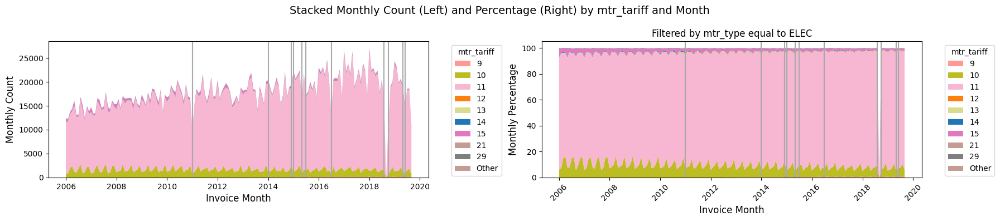

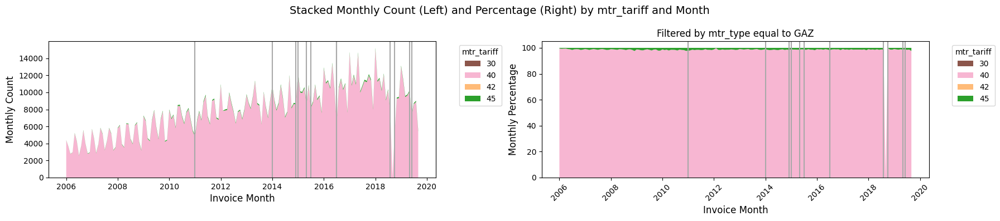

In [17]:
col_names = [['mtr_type', 'ELEC', 'mtr_tariff', date_mask],
             ['mtr_type', 'GAZ', 'mtr_tariff', date_mask]]
for item in col_names:
    Plot_Volume_Over_Time(df=df_train, group_name=item[0], group_filter=item[1], sub_group_name=item[2], xlim=item[3], date_markers=date_markers)

Nothing stands out. Perhaps the periodicity of MT10 seems to change after 2008 slightly, and MT15 seems to slowly shrink over time in lieu of MT11.

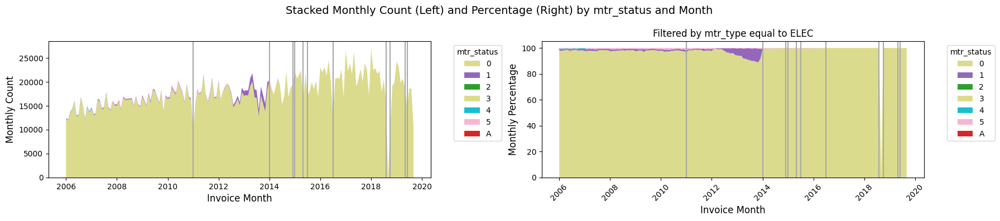

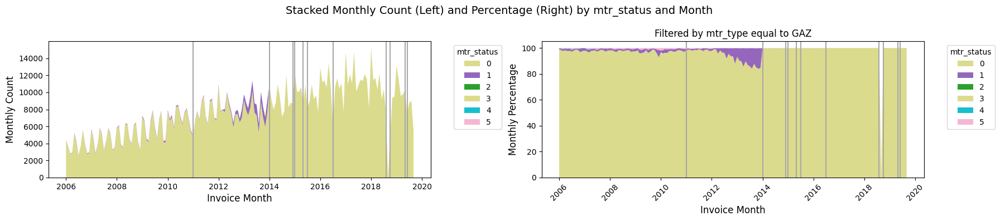

In [18]:
col_names = [['mtr_type', 'ELEC', 'mtr_status', date_mask],
             ['mtr_type', 'GAZ', 'mtr_status', date_mask]]
for item in col_names:
    Plot_Volume_Over_Time(df=df_train, group_name=item[0], group_filter=item[1], sub_group_name=item[2], xlim=item[3], date_markers=date_markers)

There is an interested accumulation of MS1 building up from ~2012 up to 2014, before dropping once again. This coincides with the change to MT11 to include 'usage_3' and 'usage_4' for the first time. However, there are some cases of MS1 for many years prior. Furthermore, the same pattern in MS1 is also present in Gas, which does not have MT11. It is therefore not clear what this means.

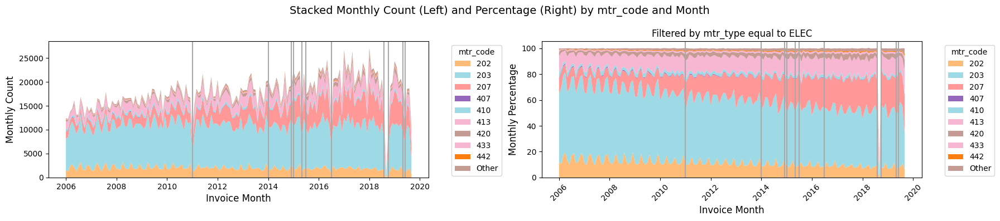

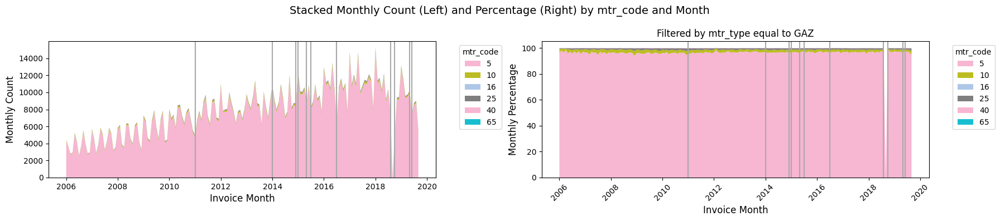

In [19]:
col_names = [['mtr_type', 'ELEC', 'mtr_code', date_mask],
             ['mtr_type', 'GAZ', 'mtr_code', date_mask]]
for item in col_names:
    Plot_Volume_Over_Time(df=df_train, group_name=item[0], group_filter=item[1], sub_group_name=item[2], xlim=item[3], date_markers=date_markers)

In many ways, 'mtr_code' is the most challenging to interpret. I basically have no idea as to what it is...

There is quite a strong growth in MC207 and shrinkage in MC203 and MC202. Note that the plotting aggregates smaller categories into an "Other". Gas seems very stable throughout.

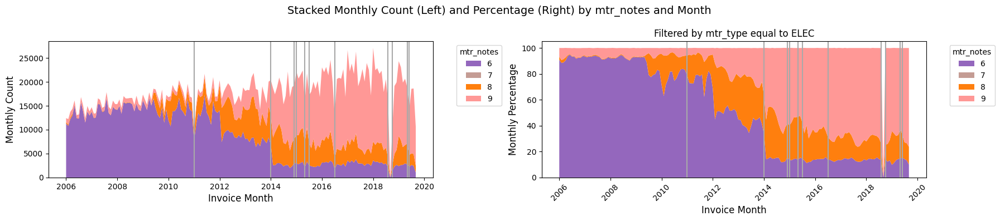

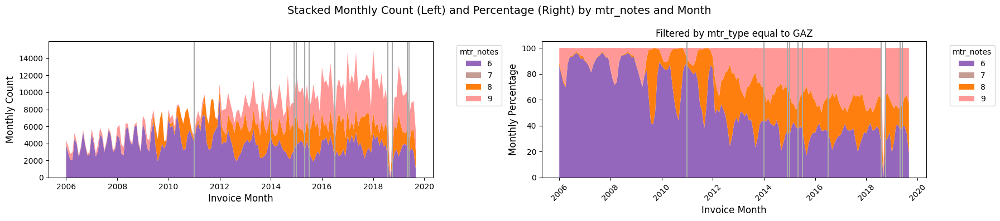

In [20]:
col_names = [['mtr_type', 'ELEC', 'mtr_notes', date_mask],
             ['mtr_type', 'GAZ', 'mtr_notes', date_mask]]
for item in col_names:
    Plot_Volume_Over_Time(df=df_train, group_name=item[0], group_filter=item[1], sub_group_name=item[2], xlim=item[3], date_markers=date_markers)

Along with 'mtr_status', 'mtr_notes' seems the most interesting. Seems to have clear shifts over time.
* Electricty:
   * ~2009 MN8 abruptly grows in prevelance at the expense of MN6.
   * ~2012 MN6 abruptly shrinks once more, with MN8 and MN9 growing in its places.
   * ~2014 MN6 abruptly shrinks once final time, where it remains stable until the end.
   * ~2014 MN9 grows, and keeps growing until the end, with MN6 and MN8 shrinkage to compensate.
   * Prior ~2009 and after ~2014, MN6 is quite stable, but in between, it is more volatile (in addition to the abrupt shifts noted above).
   * The absolute volume of MN6 seems quite stable before ~2009 and after ~06/2010, with a noticeable dip in between.
   * The absolute volume of all have a very noticeable dip ~2011. 
* Gas:
   * ~2009 MN8 abruptly grows in prevelance at the expense of MN6.
   * ~2012 MN6 abruptly shrinks once more, with primarily MN9 growing in its places.
   * There is no final abrupt shift to MN6 ~2014 visible for gas.
   * ~2012 to the end, MN9 grows steadily, mainly in place of MN6.
   * MN6, MN8, and MN9 are all very periodic the whole duration. However, the expected patterns seems distrupted at ~2009 and ~2012.
   * Between ~2009 and ~2010, there is a noticeable dip in absolute volume of MN6, before retrunging somewhat similar to value prior ~2009.
   * ~2012 onwards, is a noticeable step change (drop) in absolute volumnes of MN6. Seems to follow new stable pattern, along with MN8.
   * In contrast, the absolute volumes of MN9 keeps growing over time ~2012 onwards.

Conclusions:

~06/2009 MN8 grows abruptly for Gas and Electricity. There is potentially a 9month period to ~03/2010 whre MN6 seems below usual volumnes. This period is more noticeable in MN6 for Gas than it is for Electricity.

~2012 shows abrupt change for MN6, MN8, and MN9 for Gas and Electricity. However, MN8 in Gas shows a more subtle change.

~2014 seems only relevant to Electricity, and seemingly only MN6 and MN9. Since this was the date for changes to MT11 (electricity), it makes sense to not affect gas.

The volumes of invoices for Electricity do not seem strongly seasonal, except for those for MN8. These seem to dip every autumn and peak spring.
Gas, in contrast, seems highly seasonal, but out of phase: MN6 and MN9 peak between winter and summer. MN8 instead peaks between autumn and spring. 

This is quite confusing. 'mtr_notes' was described as:
*  "notes that the STEG agent takes during his visit to the cleint (e.g.: if the counter shows something wrong, the"

This implies a manual label. Not clear why this would be seasonal. 'months_num' == 4 is by far the most common, such that it could not explain the peaks are ~4x the troughs. Furthermore, a bill in autumn will most likely cover the summer period, where heating would not expected to be too high. In constrast, MN8 is at its lowest around spring, which would cover winter; the expected highest usage period. One potential theory might be 'offsetting' of usage. Since energy is subsidised in Tunisia, it may be that some attempt to under-report in winter periods and over-report in summer periods, to maximise the subsides amount for the whole year. This would present as lower-than-expected seasonality, with higher usage in summer and lower in winter than non-fraud cases. Will investigate later.  

Will explore with greater granularity by dividing in 'mtr_tariff', the three most common are:
1. MT11 (E) - skipped
2. MT40 (G) - skipped
3. MT10 (E)

#### (Not) Looking at MT40:
MT40 is used for over 95%+ of gas. As such, its outputs would simply look like those for gas shown above and are not repeated.

#### (Not) Looking at MT11:
MT11 is used for ~90% of electricity and so is the only other 'mtr_tariff' close in size to MT40. Inspection shows no noticeable different from the plots above and are not repeated.

One note is that the steady increase of MS1 before an abrupt halt in 2014, seems to be correlated with the final drop in MN6 mentioned, but the magnitudes do not align, with the drop in MT6 being ~5x more than MS1.

#### Looking at MT10:
MT10 is used for ~10% electricity, leaving < ~5% for the remaining 'mtr_tariffs' combined.

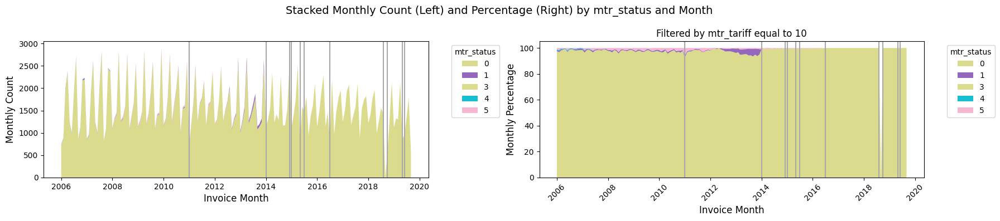

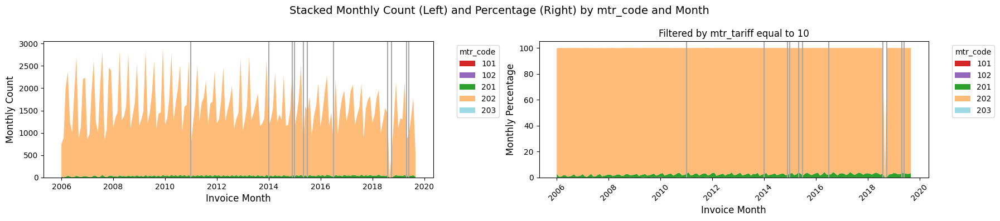

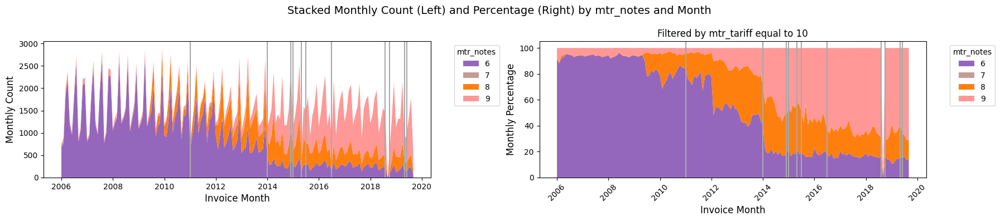

In [21]:
date_mask = '2006-01-01 00:00:00'
col_names = [['mtr_tariff', 10, 'mtr_status', date_mask],
             ['mtr_tariff', 10, 'mtr_code', date_mask],
             ['mtr_tariff', 10, 'mtr_notes', date_mask]]
for item in col_names:
    Plot_Volume_Over_Time(df=df_train, group_name=item[0], group_filter=item[1], sub_group_name=item[2], xlim=item[3], date_markers=date_markers)

Counts seem very periodic initially, though it seems to smoothen out slightly.

'mtr_notes' seem very similar to MT11. Seems to have much less variation in 'mtr_code' though, with ~95% MC202 and ~5% MC201. Does not have same level of accumulating MS1 prior ~2014.

#### Interesting Dates Added:
Although there still is not much insight as to what these values mean, some additional dates do seem to stand out to add to the list:
1. 2005/06/29: Earliest case of Fraud.
2. 2005/07/01: One set of 'monthly_cap' changes to 'mtr_tariff' = 11.
3. 2009/06/17: 'mtr_notes' == 8 quickly increases in prevalence. [New]
4. 2011/01/14 - 2011/01/25: 12-day period of low invoices. Substantial political unrest, culminating governmental change in mid-January.
5. 2012/02/01: 'mtr_notes' == 6 has sharp drop-off from here onwards. [New]
6. 2014/01/01: Another set of 'monthly_cap' changes to 'mtr_tariff' = 10|11.
7. 2014/12/27 - 2015/01/04: 9-day period of low invoices. Could not find any potential reason.
8. 2015/05/19 - 2015/05/27: 9-day period of low invoices. Their president visited USA 2015/05/20 - 2015/05/21 (very dubious link).
9. 2016/07/02 - 2016/07/10: 9-day period of low invoices. Could not find any potential reason.
10. 2018/08/31 - 2018/10/10: 41-day period of low invoices. Their energy minister was fired for corruption on 2018/08/31 (plausible link).
11. 2019/05/28 - 2019/06/09: 13-day period of low invoices. Could not find any potential reason.

In [33]:
date_markers = ['2005/06/29 00:00:00', 
                '2005/07/01 00:00:00',
                '2009/06/17 00:00:00',
                '2011/01/14 00:00:00', '2011/01/25 23:59:59',
                '2012/02/01 00:00:00',
                '2014/01/01 00:00:00',
                '2014/12/27 00:00:00', '2015/01/04 23:59:59',
                '2015/05/19 00:00:00', '2015/07/10 23:59:59',
                '2016/07/02 00:00:00', '2016/07/10 23:59:59',
                '2018/08/31 00:00:00', '2018/10/10 23:59:59',
                '2019/05/28 00:00:00', '2019/06/09 23:59:59']

### Client features over time
Looking at some client-specific features: 'client_type', 'district', 'region', 'fraud' and 'start_date' next.

For these interested in viewing some alternative counts:
* Tracking based on each invoice (as before)
* Tracking first instance of a given client
* Tracking last instance of a given client

The latter two may provide insight as to how the dataset was selected, and potentially, information regarding fraud.

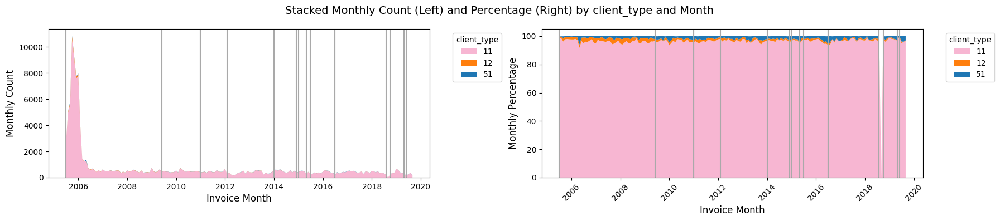

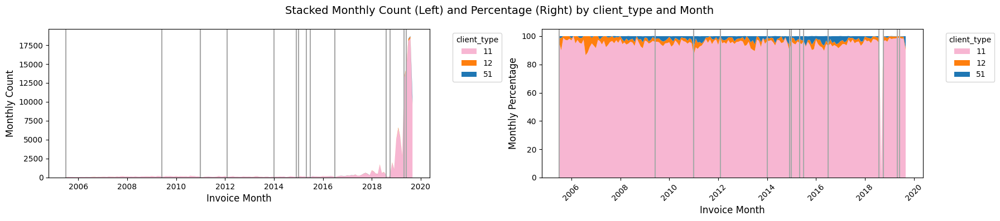

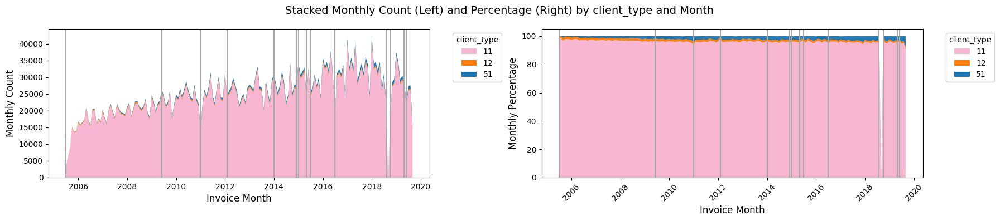

In [23]:
date_mask = '2005-07-01 00:00:00'
col_names = [['client_type', None, None, date_mask]]
df_temp = df_train.sort_values(by='invoice_date').groupby(['client_id'])
for item in col_names:
    Plot_Volume_Over_Time(df=df_temp.agg('first'), group_name=item[0], group_filter=item[1], sub_group_name=item[2], xlim=item[3], date_markers=date_markers)
    Plot_Volume_Over_Time(df=df_temp.agg('last'), group_name=item[0], group_filter=item[1], sub_group_name=item[2], xlim=item[3], date_markers=date_markers)
    Plot_Volume_Over_Time(df=df_train, group_name=item[0], group_filter=item[1], sub_group_name=item[2], xlim=item[3], date_markers=date_markers)

Stable proportions over time. Nothing seems to stand out. Perhaps CT15 for Gas seems to be growing steadily over time. As would be expected, most new clients were introduced <2007, with then a small but steady stream of new clients introduced over time. There are almost not clients that were removed <2017, with small bump between 2017-2019, before numbers rapidly increasing through to the end. This indicates no large scale 'purges' in the dataset.

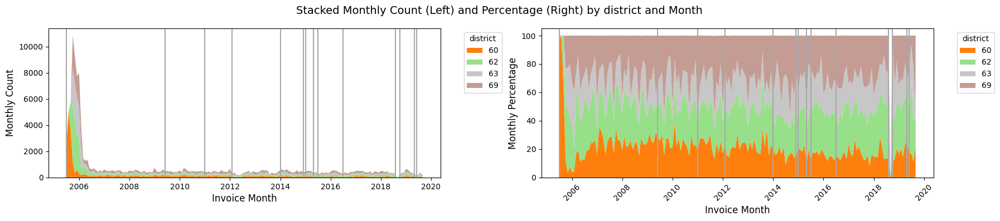

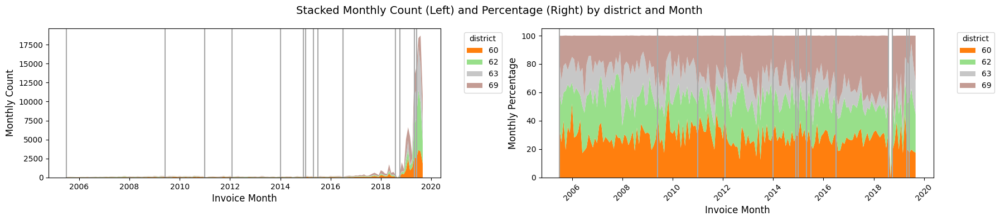

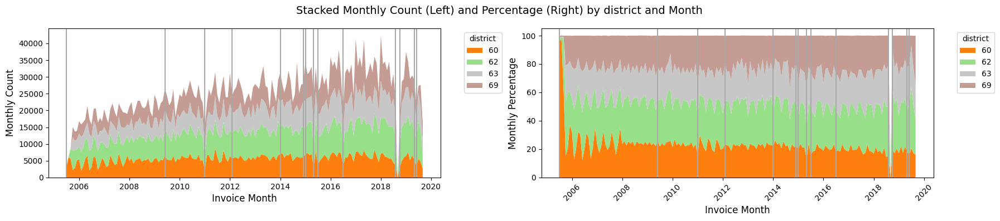

In [24]:
date_mask = '2005-07-01 00:00:00'
col_names = [['district', None, None, date_mask]]
for item in col_names:
    Plot_Volume_Over_Time(df=df_temp.agg('first'), group_name=item[0], group_filter=item[1], sub_group_name=item[2], xlim=item[3], date_markers=date_markers)
    Plot_Volume_Over_Time(df=df_temp.agg('last'), group_name=item[0], group_filter=item[1], sub_group_name=item[2], xlim=item[3], date_markers=date_markers)
    Plot_Volume_Over_Time(df=df_train, group_name=item[0], group_filter=item[1], sub_group_name=item[2], xlim=item[3], date_markers=date_markers)

Not sure how significant this is, but it seems almost all new invoices were initially D60. D62 seems to have started a bit later, with D63 and D69 started approximately together a short time after that. With manual inspection the approximate dates for rapid increases are:
* D62: 2005/09/15
* D63: 2005/10/07
* D69: 2005/10/06

This is quite unusual and can be indicative of manual intervention. For example, districts were added over time to reach the desired data volume.

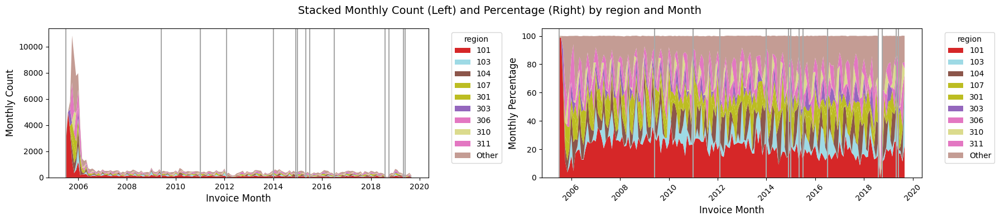

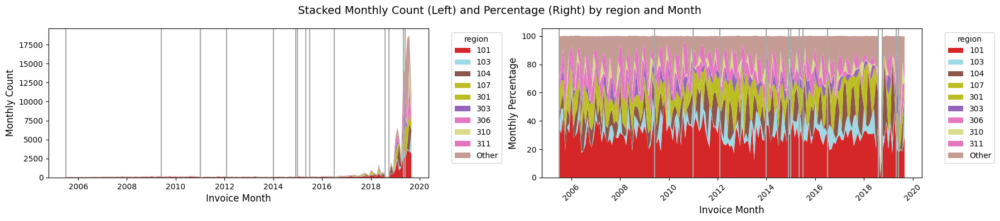

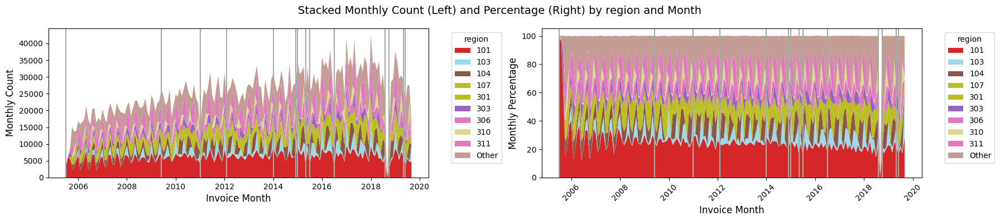

In [25]:
date_mask = '2005-07-01 00:00:00'
col_names = [['region', None, None, date_mask]]
for item in col_names:
    Plot_Volume_Over_Time(df=df_temp.agg('first'), group_name=item[0], group_filter=item[1], sub_group_name=item[2], xlim=item[3], date_markers=date_markers)
    Plot_Volume_Over_Time(df=df_temp.agg('last'), group_name=item[0], group_filter=item[1], sub_group_name=item[2], xlim=item[3], date_markers=date_markers)
    Plot_Volume_Over_Time(df=df_train, group_name=item[0], group_filter=item[1], sub_group_name=item[2], xlim=item[3], date_markers=date_markers)

Region is closely tried with District as a feature. It is quite difficult to interpret given the many possible values. It will be dropped for now.

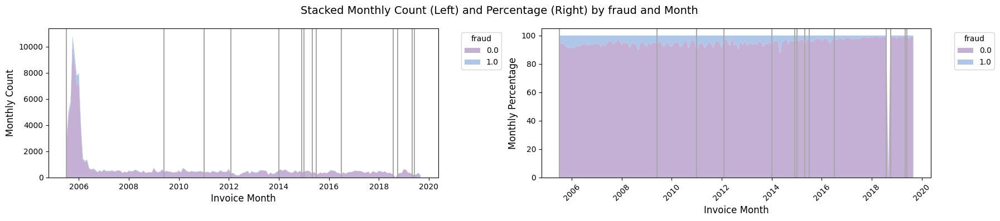

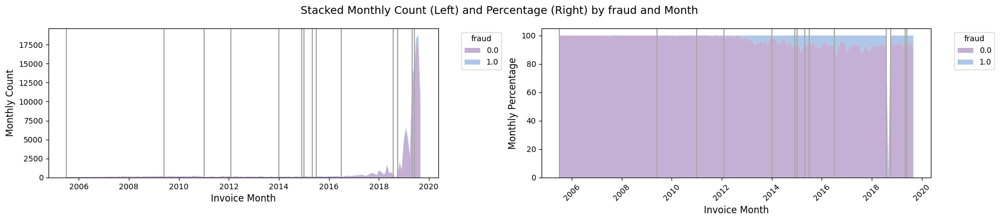

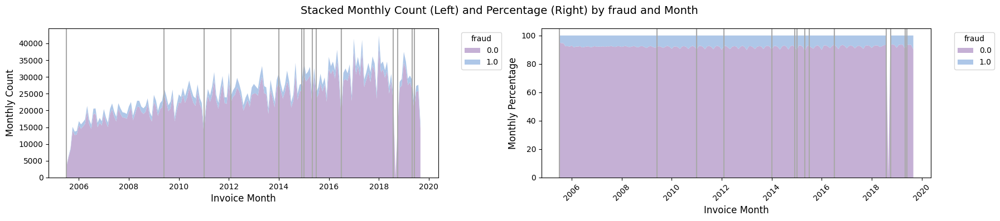

In [26]:
date_mask = '2005-07-01 00:00:00'
col_names = [['fraud', None, None, date_mask]]
for item in col_names:
    Plot_Volume_Over_Time(df=df_temp.agg('first'), group_name=item[0], group_filter=item[1], sub_group_name=item[2], xlim=item[3], date_markers=date_markers)
    Plot_Volume_Over_Time(df=df_temp.agg('last'), group_name=item[0], group_filter=item[1], sub_group_name=item[2], xlim=item[3], date_markers=date_markers)
    Plot_Volume_Over_Time(df=df_train, group_name=item[0], group_filter=item[1], sub_group_name=item[2], xlim=item[3], date_markers=date_markers)

A note regarding fraud: it is really important to not conflate the above figures as showing when the fraud occurred. This is when the first invoice associated with a 'client_id' flagged with fraud was recorded: it may have been later invoices that triggered the flagging! However, the plot show a steady trailing off, with the proportion of newly introduced accounts that are flagged decreasing over time. This can also be confounded by there simply less time for them to be flagged! 

Nevertheless, based on this, it would appear it is more that more recent accounts, rather than just younger accounts, are less likely to be fraud. This also visible by how few final invoices were prior 2015. Almost none of the accounts that ended prior 2012 are flagged with fraud. Will look at fraud in closer detail later.

#### Conclusions:
* MS1 had an interested trend up to 2014, and it may prove relevant. But it was difficult to interpret.
* 'mtr_notes' seems significant in that it has very strong shifts in trend over time. In particular:
   * 2009/06/17: MN8 quickly increases in prevalence.
   * 2012/02/01: MN6 has sharp drop-off from here onwards.

## General Descriptive Statistics
Would typically start here but was wary of mis-aggregating, which turned out to be a relevant concern. 

There are too many aspects to consider. Will only consider those after 2016, and will focus on following:
* Energy Usage:
   * e.g. what can be inferred about expected usage based on a given stat
   * Would be useful to have a "benchmark" when looking at a given invoice's usage for context
* Feature Interactions:
   * e.g. relationship between 'mtr_code' and 'mtr_status'
   * One use for this analysis is to try and reduce total possible permutations of feature set
   * Another use is to gain understanding in interpretting the data

### Energy Usage (2 of 2):
This section focusses on aggregate energy usage for determining trends and/or influence of certain fields.
* When interested in usage trends, will use the per-month format.
* When interested in influence of given fields on usage, will use the original per-invoice format.
* As discussed, "missing" values are ignored here.

#### Aggregate Quantiles over Time:
'Plot_Metric_Quantiles_Over_Time()' function plots the quantiles for population-aggregated metric on a monthly aggregation. Uses 'invoice_month'.

In [47]:
def Plot_Metric_Quantiles_Over_Time(df, mask_left, mask_right, name_left, name_right, metric, metric_name, trend=None, filt_size=17, xlim='2005-06-01 00:00:00', date_markers=None):
    if xlim is not None:
        mask_left = mask_left & (df['invoice_date'] >= xlim)
        mask_right = mask_right & (df['invoice_date'] >= xlim)
    fig, axes = plt.subplots(1, 2, figsize=(16, 4), sharey=True)
    for (ax,mask,name) in zip(axes,[mask_left,mask_right],[name_left,name_right]):
        # Adding the markers first, converting the date_markers to similar x-axis: may cause some shifting!
        if date_markers is not None:
            date_markers = pd.to_datetime(pd.Series(date_markers)).dt.to_period('M').dt.to_timestamp()
            if xlim is not None:
                date_markers = date_markers[(date_markers >= xlim) & (date_markers <= df['invoice_month'].max())]
                for date_marker in date_markers:
                    ax.axvline(x = date_marker, color = 'darkgrey')
        df_temp = df[mask].groupby(['invoice_month'])[metric].quantile([0.05, 0.25, 0.5, 0.75, 0.95]).unstack()
        df_temp.columns = ['Q05', 'Q25', 'Q50', 'Q75', 'Q95']
        for col, color in zip(df_temp.columns, ['red', 'orange', 'green', 'orange', 'red']):
            ax.plot(df_temp.index, df_temp[col], label=col, color=color, alpha=1 if trend is None else 0.3)
            if trend == 'lm':
                x, y = pd.to_numeric(df_temp.index), pd.to_numeric(df_temp[col]) 
                p = np.poly1d(np.polyfit(x[~np.isnan(y)], y[~np.isnan(y)], 1))
                ax.plot(df_temp.index, pd.to_datetime(p(x)), linestyle='--', label=f'{col} Trend', color="dark"+color)
            elif trend == 'med':
                ax.plot(df_temp.index, medfilt(df_temp[col].ffill(), kernel_size=filt_size), color="dark"+color)
        ax.set_xlabel('Invoice Date')
        ax.set_ylabel(metric_name)
        if date_markers is None:
            ax.grid(True)
        else:
            ax.grid(axis='y')
        ax.set_title(f'Quantiles of {metric_name} by Invoice Date: {name}')
    ax.set_ylim(0, df.loc[(mask_left|mask_right), metric].quantile(0.99))
    ax.legend(title=f'{metric_name} Quantiles')
    plt.tight_layout()

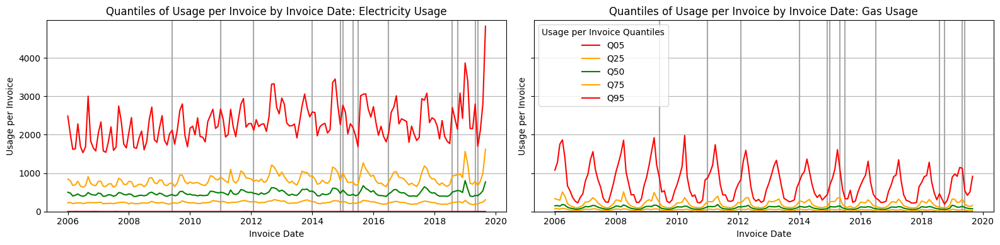

In [122]:
date_mask = '2006-01-01 00:00:00'
mask_left = (df_train['mtr_type'] == 'ELEC') 
mask_right = (df_train['mtr_type'] == 'GAZ')
Plot_Metric_Quantiles_Over_Time(df_train, mask_left, mask_right, "Electricity Usage", "Gas Usage", 'usage_n', 'Usage per Invoice', None, 3, date_mask, date_markers)

As was discussed in the Section "Energy Usage (1 of 2)", using raw usage can be a bit misleading as it may represent varying number of months of a given invoice. Therefore, looking at 'monthly_usage':

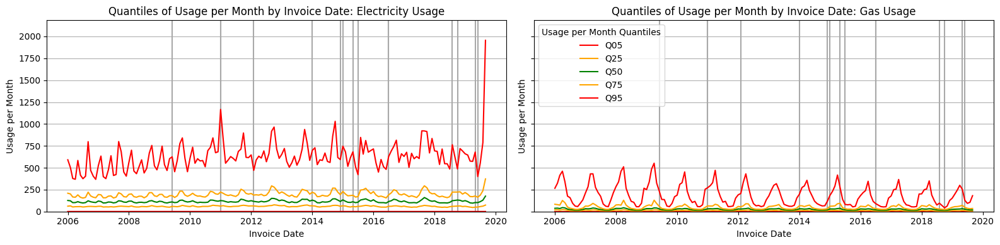

In [22]:
date_mask = '2006-01-01 00:00:00'
mask_left = (df_train['mtr_type'] == 'ELEC')
mask_right = (df_train['mtr_type'] == 'GAZ')
Plot_Metric_Quantiles_Over_Time(df_train, mask_left, mask_right, "Electricity Usage", "Gas Usage", 'monthly_usage', 'Usage per Month', None, 3, date_mask, date_markers)

Although better, as was discussed in the Section "Energy Usage (1 of 2)", it can be useful to alter the data format to have a distinct row for each month, and distribute usage accordingly.

In [23]:
df_temp = Gen_Per_Month_Usage(df_train)

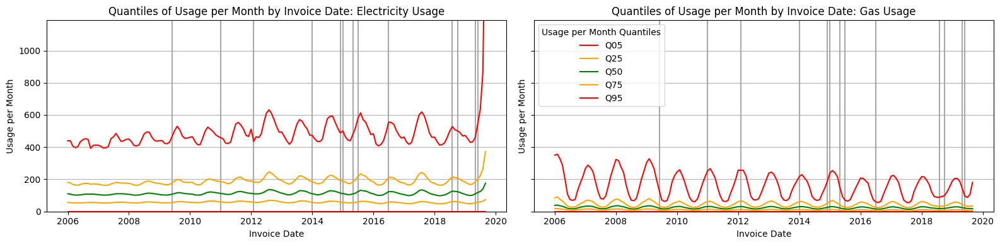

In [19]:
date_mask = '2006-01-01 00:00:00'
mask_left = (df_temp['mtr_type'] == 'ELEC')
mask_right = (df_temp['mtr_type'] == 'GAZ')
Plot_Metric_Quantiles_Over_Time(df_temp, mask_left, mask_right, "Electricity Usage", "Gas Usage", 'monthly_usage', 'Usage per Month', None, 3, date_mask, date_markers)

This provides a much cleaner visual. Although this is useful for general comparison, point-wise comparison at a given date is a bit difficult. Therefore, "Plot_Metric_Quantiles_Over_Time_Alt()" function will instead plot each of the Q25, Q50, and Q75 lines in their own plot, where both populations are plotted together:

In [46]:
def Plot_Metric_Quantiles_Over_Time_Alt(df, mask_left, mask_right, name_left, name_right, metric, metric_name, xlim='2005-06-01 00:00:00', date_markers=None):
    if (xlim is not None):
        mask_left = mask_left & (df['invoice_date'] >= xlim)
        mask_right = mask_right & (df['invoice_date'] >= xlim)
    fig, axes = plt.subplots(3, 1, figsize=(16, 6))
    for (mask,name) in zip([mask_left,mask_right],[name_left,name_right]):
        df_temp = df[mask].groupby(['invoice_month'])[metric].quantile([0.75, 0.50, 0.25]).unstack()
        df_temp.columns = ['Q75', 'Q50', 'Q25']
        df_temp = pd.merge(left=pd.DataFrame(data = {'invoice_month':pd.date_range(start=df.loc[(mask_left|mask_right),'invoice_month'].min(), 
                                                                                   end=df.loc[(mask_left|mask_right),'invoice_month'].max(), freq="MS")}), 
                           right=df_temp, on='invoice_month', how="left")
        df_temp = df_temp.fillna(0).set_index('invoice_month').sort_index()
        for ax, col, color in zip(axes, df_temp.columns, ['orange', 'green', 'orange']):
            # Adding the markers first, converting the date_markers to similar x-axis: may cause some shifting!
            if date_markers is not None:
                date_markers = pd.to_datetime(pd.Series(date_markers)).dt.to_period('M').dt.to_timestamp()
                if xlim is not None:
                    date_markers = date_markers[(date_markers >= xlim) & (date_markers <= df['invoice_month'].max())]
                    for date_marker in date_markers:
                        ax.axvline(x = date_marker, color = 'darkgrey')
            ax.plot(df_temp.index, df_temp[col], label=name, color=color if name==name_left else 'darkred')
            ax.set_ylabel(f"{metric_name} {col}")
            ax.legend(title=f'{metric_name}')
            if date_markers is None:
                ax.grid(True)
            else:
                ax.grid(axis='y')
        ax.set_xlabel('Invoice Date')
    #ax.set_suptitle(f'Quantiles of {metric_name} by Invoice Date: {name_left} vs {name_right}')
    fig.suptitle(f'Quantiles of {metric_name} by Invoice Date: {name_left} vs {name_right}', fontsize=16)
    fig.tight_layout()

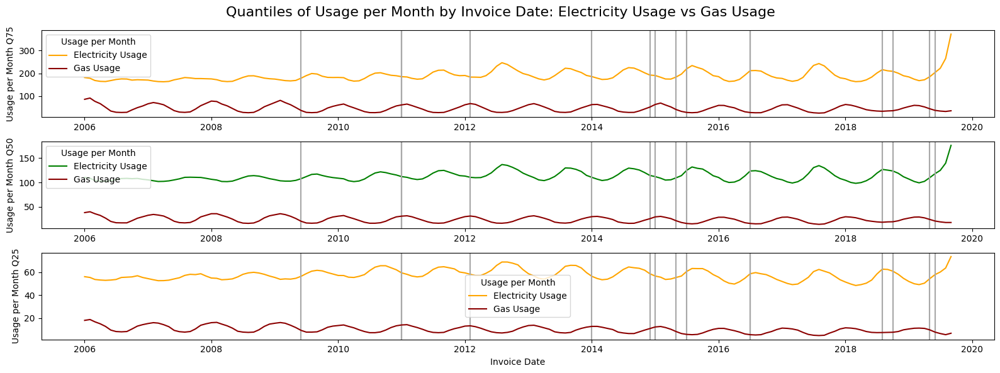

In [25]:
date_mask = '2006-01-01 00:00:00'
mask_left = (df_temp['mtr_type'] == 'ELEC')
mask_right = (df_temp['mtr_type'] == 'GAZ')
Plot_Metric_Quantiles_Over_Time_Alt(df_temp, mask_left, mask_right, "Electricity Usage", "Gas Usage", 'monthly_usage', 'Usage per Month', date_mask, date_markers)

Can now trivially compare any of the three quantiles at any point in time.
* Can see that though both are seasonal, gas peaks in summer whereas electricity peaks in summer.
* Electricity usage is consistently higher throughout (although units are unknown).
* Electricity usage seems develop clearer seasonality over time whereas gas seems consistently seasonal throughout. Arguably, ~2012 divides clarity of seasonality in energy usage best. 
* Electricity usage >2019 begins to spike very high whereas gas does not. (This was even more noticeably for the Q95) 

#### Aggregate Quantiles
Rather than plot everything on a per-month or per-invoice manner, it can also be simpler to aggregate into a single value:

In [19]:
q_names = [0.00,0.02,0.05,0.25,0.50,0.75,0.95,0.98,1.00]

In [20]:
def View_Quantiles(df, group, metric, col_names=q_names):
    return(df.groupby([group], observed=True)[metric]
           .quantile(col_names).reset_index()
           .pivot_table(index=group, columns='level_1', values=metric).round(0))

In [22]:
def Plot_Quantiles(df, group, metric, col_names=q_names):
    df = View_Quantiles(df, group, metric, col_names)

    # Plot
    fig, ax = plt.subplots(figsize=(1+len(df), 6))

    for i, (group_val, quantiles) in enumerate(df.iterrows()):
        x = [i - 0.3, i + 0.3]  # Range for each group (horizontal width)
        
        # Extract quantiles
        q0, q2, q5, q25, q50, q75, q95, q98, q100 = quantiles.values
        
        # Shaded regions
        ax.fill_between(x, q2, q98, color="orange", label="2nd-98th" if i == 0 else None)
        ax.fill_between(x, q5, q95, color="yellow", label="5th-95th" if i == 0 else None)
        ax.fill_between(x, q25, q75, color="green", label="25th-75th" if i == 0 else None)
        # Min, Median, Max lines
        ax.hlines(q0, x[0], x[1], color="red", linewidth=2, label="Minimum" if i == 0 else None)
        ax.hlines(q50, x[0], x[1], color="black", linewidth=2, label="Median" if i == 0 else None)
        ax.hlines(q100, x[0], x[1], color="red", linewidth=2, label="Maximum" if i == 0 else None)

    ax.set_xticks(range(len(df)))
    ax.set_xticklabels(df.index)
    ax.axis(ymin = df[0.02].min(), ymax = df[0.98].max())
    ax.set_xlabel(group)
    ax.set_ylabel(metric)
    ax.legend()

In [35]:
View_Quantiles(df_temp[df_temp['invoice_date'] < date_mask], 'mtr_type', 'monthly_usage')

level_1,0.00,0.02,0.05,0.25,0.50,0.75,0.95,0.98,1.00
mtr_type,,,,,,,,,
ELEC,0.0,0.0,0.0,41.0,98.0,165.0,450.0,848.0,20306.0
GAZ,0.0,0.0,0.0,8.0,22.0,42.0,191.0,335.0,5868.0


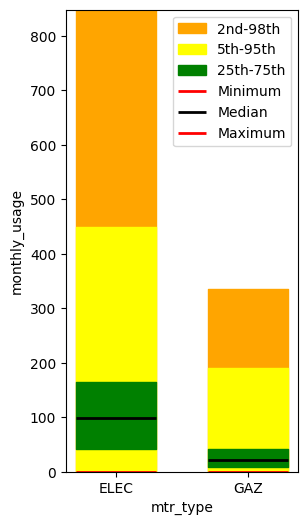

In [43]:
Plot_Quantiles(df_temp[df_temp['invoice_date'] < date_mask], 'mtr_type', 'monthly_usage')

#### Factors Influencing Usage
Am interested in which fields have a strong influence of expected usage:
* Client level features:
   * 'client_type'
   * 'district'
   * 'region'
   * 'fraud'
* Meter level features:
   * 'mtr_type'
   * 'mtr_tariff'
   * 'mtr_status'
   * 'mtr_code'
   * 'mtr_notes'

There will of course be instances where multiple fields have competing or compounding affects on the usage.

##### Usage versus 'client_type':

For brevity, will not be plotting using 'Plot_Metric_Quantiles_Over_Time()' function; will instead only use 'Plot_Metric_Quantiles_Over_Time_Alt_Multi()' function. This one is a bit redundant compared to 'Plot_Metric_Quantiles_Over_Time_Alt()' but differs in that it is for plotting more than just two sets of data. It has additional quantiles to make up for not using other plot.

In [42]:
def Plot_Metric_Quantiles_Over_Time_Alt_Multi(df, group, group_name, metric, metric_name, xlim='2005-06-01 00:00:00', date_markers=None):
    def Calc_Colour(value):
        hashed_value = int(hashlib.md5(str(value).encode()).hexdigest(), 16)
        cmap = plt.get_cmap('tab20') # use the colormap to get the color
        return mcolors.rgb2hex(cmap((hashed_value % 1000) / 1000)) # will not need more than 10 colours

    if (xlim is not None):
        df = df[(df['invoice_date'] >= xlim)]
    fig, axes = plt.subplots(5, 1, figsize=(16, 9))
    for mask in df[group].unique():
        df_temp = df[df[group] == mask].groupby(['invoice_month'])[metric].quantile([0.95, 0.75, 0.50, 0.25, 0.05]).unstack()
        df_temp.columns = ['Q95', 'Q75', 'Q50', 'Q25', 'Q05']
        df_temp = pd.merge(left=pd.DataFrame(data = {'invoice_month':pd.date_range(start=df['invoice_month'].min(), 
                                                                                   end=df['invoice_month'].max(), freq="MS")}), 
                           right=df_temp, on='invoice_month', how="left")
        df_temp = df_temp.fillna(0).set_index('invoice_month').sort_index()
        for ax, col in zip(axes, df_temp.columns):
            # Adding the markers first, converting the date_markers to similar x-axis: may cause some shifting!
            if date_markers is not None:
                date_markers = pd.to_datetime(pd.Series(date_markers)).dt.to_period('M').dt.to_timestamp()
                if xlim is not None:
                    date_markers = date_markers[(date_markers >= xlim) & (date_markers <= df['invoice_month'].max())]
                    for date_marker in date_markers:
                        ax.axvline(x = date_marker, color = 'darkgrey')
            ax.plot(df_temp.index, df_temp[col], label=mask, color=Calc_Colour(mask))
            ax.set_ylabel(f"{col}")
            ax.legend(title=f'{group_name}')
            if date_markers is None:
                ax.grid(True)
            else:
                ax.grid(axis='y')
        ax.set_xlabel('Invoice Date')
    fig.suptitle(f'Quantiles of {metric_name} by Invoice Date: Grouped by {group_name}', fontsize=16)
    fig.tight_layout()

In [45]:
df_train.groupby(['client_type'])['client_id'].nunique()

client_type
11    131494
12      2321
51      1678
Name: client_id, dtype: int64

level_1,0.00,0.02,0.05,0.25,0.50,0.75,0.95,0.98,1.00
client_type,,,,,,,,,
11,-1.0,0.0,0.0,58.0,112.0,186.0,445.0,731.0,205272.0
12,0.0,0.0,0.0,13.0,93.0,211.0,841.0,1642.0,196739.0
51,0.0,0.0,0.0,456.0,1274.0,2670.0,6890.0,11066.0,499836.0


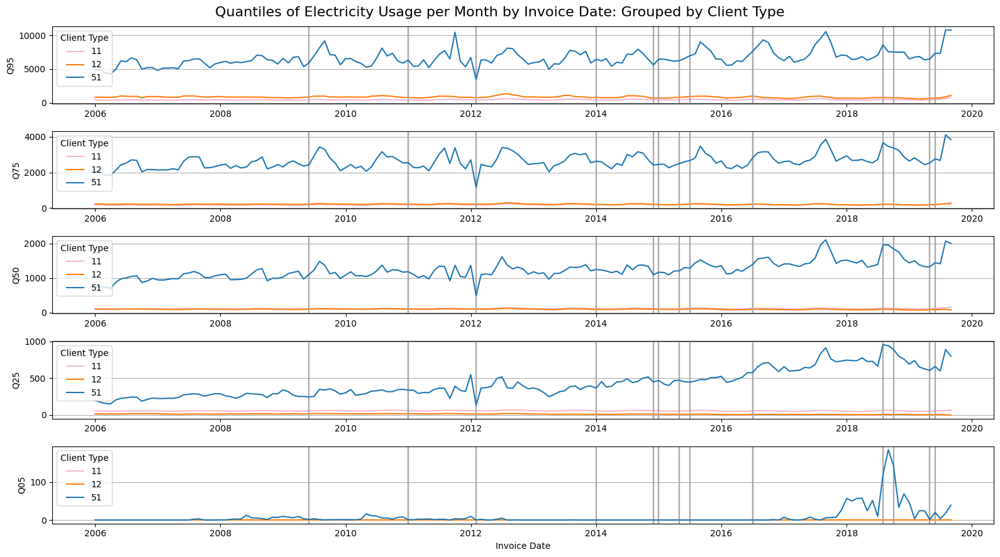

In [103]:
date_mask = '2006-01-01 00:00:00'
mask = (df_temp['mtr_type'] == 'ELEC') & (df_temp['invoice_date'] >= date_mask)
Plot_Metric_Quantiles_Over_Time_Alt_Multi(df_temp[mask], 'client_type', 'Client Type', 'monthly_usage', 'Electricity Usage per Month', date_mask, date_markers)
View_Quantiles(df_temp[mask], 'client_type', 'monthly_usage')

level_1,0.00,0.02,0.05,0.25,0.50,0.75,0.95,0.98,1.00
client_type,,,,,,,,,
11,0.0,0.0,0.0,9.0,22.0,42.0,153.0,258.0,14597.0
12,0.0,0.0,0.0,3.0,20.0,51.0,284.0,459.0,4158.0
51,0.0,0.0,0.0,82.0,411.0,1388.0,3113.0,4198.0,499955.0


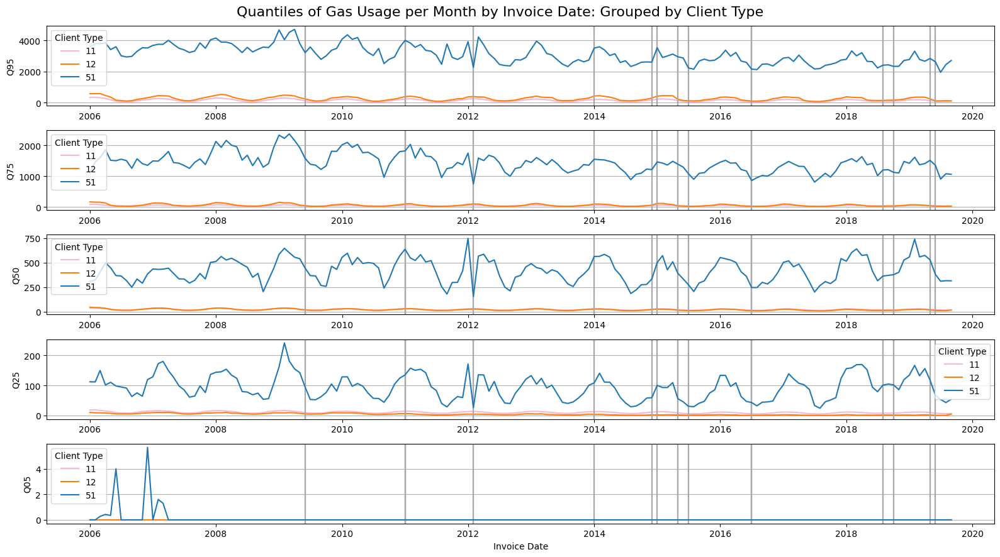

In [104]:
date_mask = '2006-01-01 00:00:00'
mask = (df_temp['mtr_type'] == 'GAZ') & (df_temp['invoice_date'] >= date_mask)
Plot_Metric_Quantiles_Over_Time_Alt_Multi(df_temp[mask], 'client_type', 'Client Type', 'monthly_usage', 'Gas Usage per Month', date_mask, date_markers)
View_Quantiles(df_temp[mask], 'client_type', 'monthly_usage')

* Electricity:
   * CT51 dwarfs CT11 and CT12.
   * CT51 has a strange dip in usage ~02/2012 (coinciding with a change in 'mtr_notes' noted earlier) not seen in neither CT11 nor CT12.
   * CT51 has a strange increase in Q05 post 2017, peaking sharply in ~2019, before dropping back down. Coincides with period of very low volume of invoices so could be due to just that.
   * CT11 and CT12 seem relatively stable over time whereas CT51 is clearly growing.
   * CT11 seems to have a higher baseline (Q25) than CT12, but lower peaks (Q75).
* Gas:
   * CT51 dwarfs CT11 and CT12.
   * CT51 has a strange dip in usage ~02/2012 (coinciding with a change in 'mtr_notes' noted earlier) not seen in neither CT11 nor CT12.
   * CT11, CT12 and CT51 all seem relatively stable over time.
   * CT11 seems to have a higher baseline (Q25) than CT12, but lower peaks (Q75).
* Conclusions:
   * Perhaps CT12 is either more seasonal in terms of climate, or has more tourism, to drive the higher variability.
   * CT51 is clearly more commericial or industrial given its much higher usage.

##### Usage versus 'district':
'region' is another closely related field to 'district'. However, it has too many categories to explore individually, so will be skipped for now.

In [58]:
df_train.groupby(['district'])['client_id'].nunique()

district
60    31922
62    40353
63    28987
69    34231
Name: client_id, dtype: int64

level_1,0.00,0.02,0.05,0.25,0.50,0.75,0.95,0.98,1.00
district,,,,,,,,,
60,0.0,0.0,0.0,52.0,110.0,198.0,679.0,1357.0,205272.0
62,-1.0,0.0,0.0,56.0,111.0,182.0,406.0,650.0,49999.0
63,0.0,0.0,0.0,58.0,104.0,163.0,338.0,507.0,67639.0
69,0.0,0.0,0.0,64.0,129.0,223.0,621.0,1146.0,499836.0


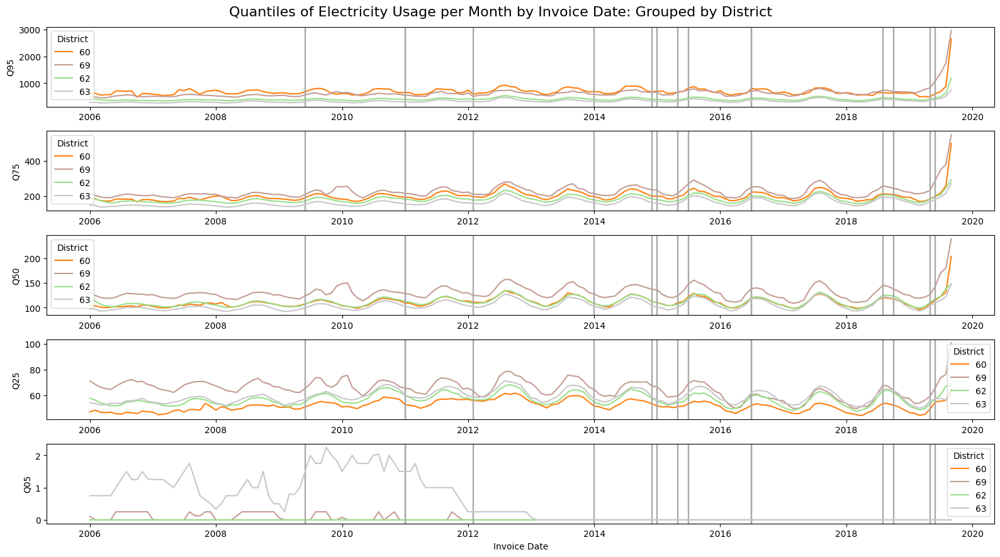

In [105]:
date_mask = '2006-01-01 00:00:00'
mask = (df_temp['mtr_type'] == 'ELEC') & (df_temp['invoice_date'] >= date_mask)
Plot_Metric_Quantiles_Over_Time_Alt_Multi(df_temp[mask], 'district', 'District', 'monthly_usage', 'Electricity Usage per Month', date_mask, date_markers)
View_Quantiles(df_temp[mask], 'district', 'monthly_usage')

level_1,0.00,0.02,0.05,0.25,0.50,0.75,0.95,0.98,1.00
district,,,,,,,,,
60,0.0,0.0,0.0,7.0,20.0,39.0,159.0,309.0,21533.0
62,0.0,0.0,0.0,12.0,23.0,41.0,147.0,259.0,14597.0
63,0.0,0.0,0.0,8.0,20.0,33.0,74.0,129.0,10598.0
69,0.0,0.0,0.0,9.0,28.0,68.0,246.0,409.0,499955.0


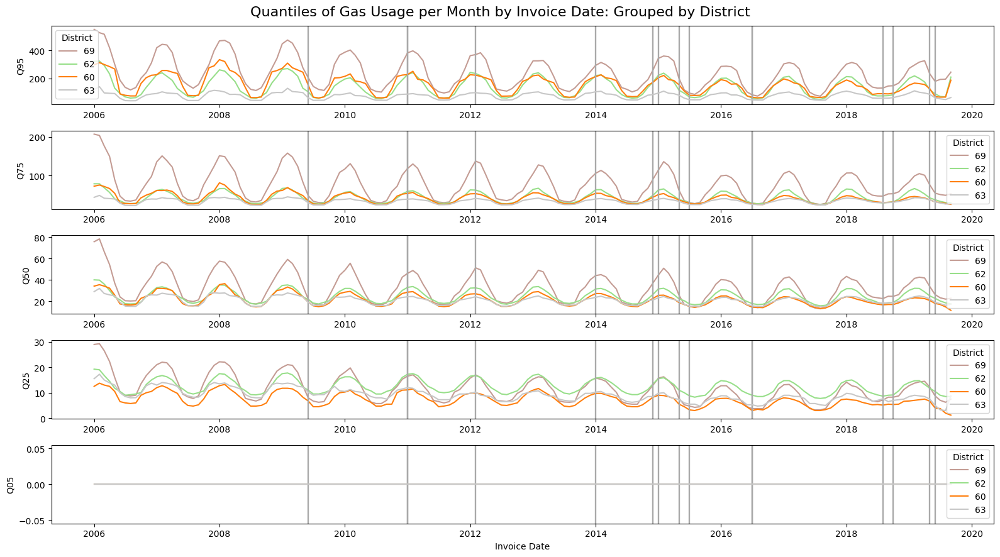

In [106]:
date_mask = '2006-01-01 00:00:00'
mask = (df_temp['mtr_type'] == 'GAZ') & (df_temp['invoice_date'] >= date_mask)
Plot_Metric_Quantiles_Over_Time_Alt_Multi(df_temp[mask], 'district', 'District', 'monthly_usage', 'Gas Usage per Month', date_mask, date_markers)
View_Quantiles(df_temp[mask], 'district', 'monthly_usage')

* Electricity:
   * D69 seems consistently higher electricity usage. D69 also has a strange bump ~2010 in usage (Q25-Q75) not seen in the others.
   * D60 seems to have the highest variability, having the lowest Q25 whilst amongst the highest Q75 and Q95, and very typical Q50.
   * D62 and D63 seem very similar throughout. Although all start to spike near the end, D62 and D63 do so the least.
   * Electricity usage is generally stable throughout, though with subtly increasing levels of seasonality over time.
* Gas:
   * D69 seems consistently higher gas usage. Although the troughs in usage are relatively similar for all; it is the peaks that drive the difference.
   * D63 is noticeably less seasonal than the others, with its peaks and troughs being most similar. D69 is the most seasonal.
   * D62 and D63 usage are very stable over time whereas D60 and D69 seem to noticeably drop over time. They are primarily driven by reduced peaks.
   * This means that, initially, D60 and D62 have the higher peaks than D63 for Q50 and Q75, but over time, D60 drops towards D63 levels whereas D62 remains more constant.
   * D60 has the lowest Q25. D69 initially has the highest, but this drops over time, until D62 is the highest.
   * Gas usage is very seasonal, the baseline remaining generally stable throughout. However, the peaks are noticeably dropping over time for D60 and D69, indicating overall reduced usage overtime.
* Conclusions:
   * D69 has clearly higher overall usage. D60 has similarly high upper extremes (Q95) in electricity usage, but not so for gas usage.
   * Both D60 and D69 are dropping in gas usage over time. D62 and D63 seem stable over time.
   * D63 seems much less seasonal in its gas usage than the others. Similarly, its overall distribution is much tighter than the others (smaller Q75 and Q95).
   * D62 seems to have a higher baseline (Q25) for both gas and electricity without necessarily higher upper ends (Q50 and Q75).
   * Perhaps D69 has the most seasonal climate and D63 the least.

##### Usage versus 'mtr_tariff':
Most of Gas is MT40 so will not repeat this. Most of Electricity is MT11, will also include MT10 (E) and MT15 (E) though note these have much smaller samples sizes.

In [70]:
df_train.groupby(['mtr_tariff'])['client_id'].nunique()

mtr_tariff
9        682
10     12778
11    122775
12       389
13       635
14       615
15      3787
18         1
21        13
24         1
27         1
29       629
30        12
40     61674
42         1
45       395
Name: client_id, dtype: int64

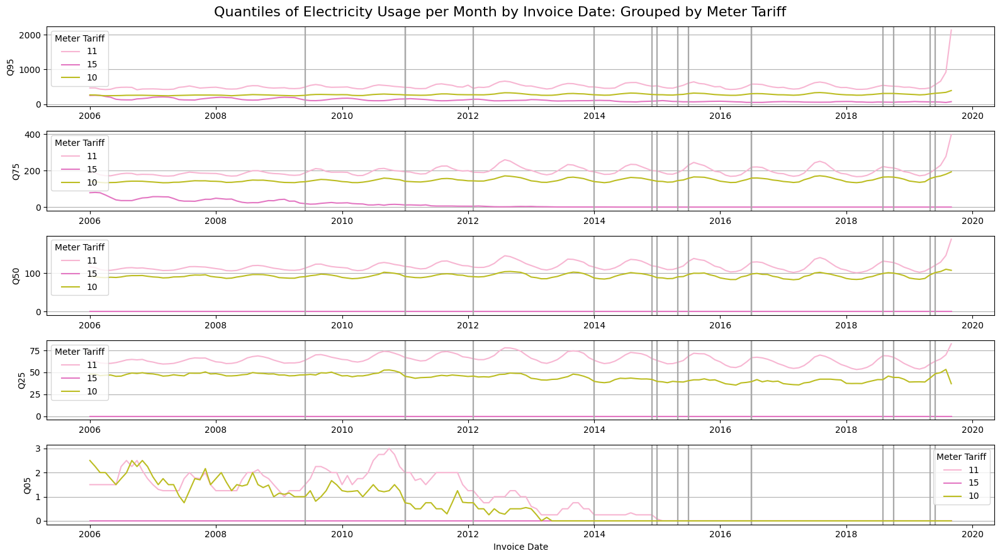

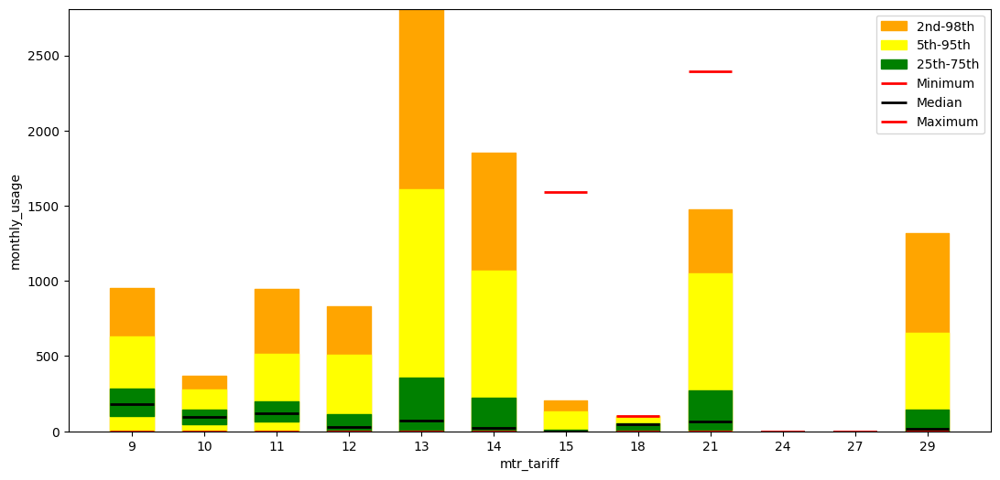

In [51]:
date_mask = '2006-01-01 00:00:00'
mask = (df_temp['mtr_type'] == 'ELEC') & (df_temp['invoice_date'] >= date_mask) & ((df_temp['mtr_tariff'] == 11) | (df_temp['mtr_tariff'] == 10) | (df_temp['mtr_tariff'] == 15))
Plot_Metric_Quantiles_Over_Time_Alt_Multi(df_temp[mask], 'mtr_tariff', 'Meter Tariff', 'monthly_usage', 'Electricity Usage per Month', date_mask, date_markers)
mask = (df_temp['mtr_type'] == 'ELEC') & (df_temp['invoice_date'] >= date_mask)
Plot_Quantiles(df_temp[mask], 'mtr_tariff', 'monthly_usage')

* Electricity:
   * MT11 has the highest usage, with MT10 being quite consistently spaced below it throughout.
   * MT11 and MT10 have overall steady usage, with slightly increasing seasonality over time. The seasonality for both are in sync, rising in summer and falling in winter.
   * MT11 and MT10 seem to be very slightly dropping in Q25 values post ~2012, though more noticeable for MT10.
   * MT11 spikes higher sharply after ~6/2019 whereas MT10 does not.
   * MT15 seems to collapse over time, and by ~6/2011, even Q75 reaches zero. Generally has many invoices of zero throughout.
   * MT15 initially had similar Q95 to MT10, but had seasonality out of phase to the others, rising in winter and falling in summer.
* Conclusions:
   * Perhaps MT15 was used for heating given its seasonality matches gas moreso than electricity. Just conjecture.
   * MT15 seems to have stopped being used over time. It was checked (but not shown), even if excluding invoices of zero usage, usage levels still collapsed.
   * MT10 and MT11 have a very consistent delta between them over time. This only is broken after 2019, where MT11 spikes very sharply.
   * MT11 is consistently higher than MT10.
   * The samples sizes for the other 'mtr_tariff' values are so small that care should be taken interpretting the quantiles.

Out of curiosity, looking at the other 'mtr_tariff' values for electricity not included above. For these, wil be excluding instances of zero usage as they are common and arguably distort the quantiles:

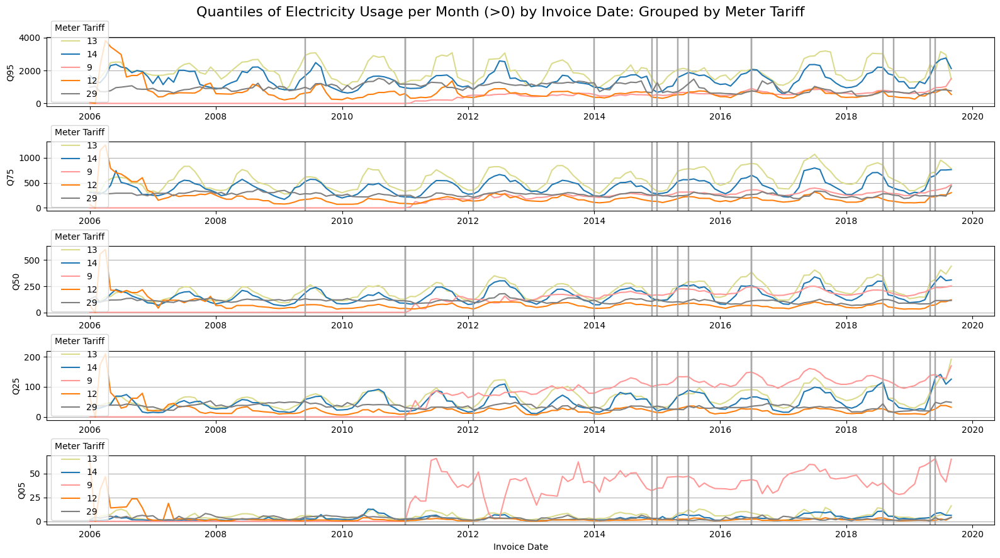

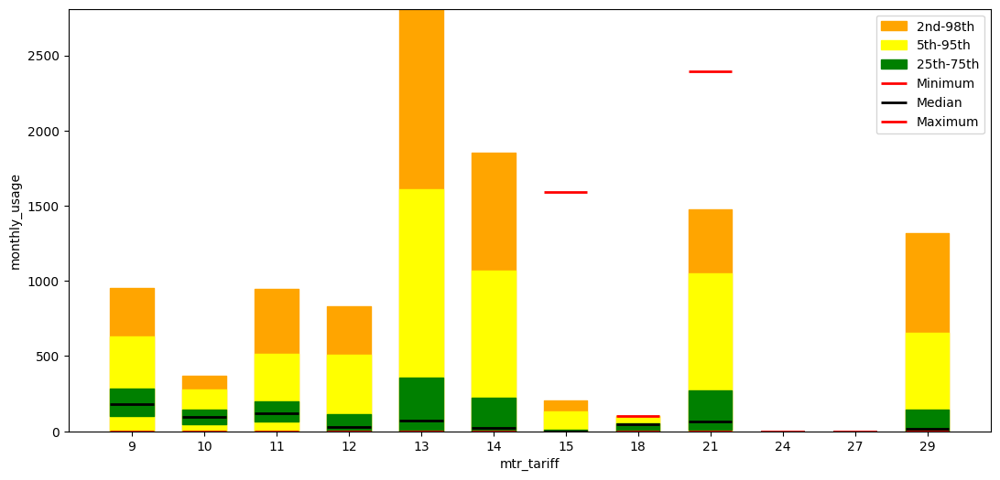

In [64]:
date_mask = '2006-01-01 00:00:00'
mask = (df_temp['monthly_usage'] > 0) & (df_temp['mtr_type'] == 'ELEC') & (df_temp['invoice_date'] >= date_mask) & ((df_temp['mtr_tariff'] != 18) & (df_temp['mtr_tariff'] != 21) & (df_temp['mtr_tariff'] != 24) & (df_temp['mtr_tariff'] != 27) & (df_temp['mtr_tariff'] != 11) & (df_temp['mtr_tariff'] != 10) & (df_temp['mtr_tariff'] != 15))
Plot_Metric_Quantiles_Over_Time_Alt_Multi(df_temp[mask], 'mtr_tariff', 'Meter Tariff', 'monthly_usage', 'Electricity Usage per Month (>0)', date_mask, date_markers)
mask = (df_temp['mtr_type'] == 'ELEC') & (df_temp['invoice_date'] >= date_mask)
Plot_Quantiles(df_temp[mask], 'mtr_tariff', 'monthly_usage')

* Conclusions^:
   * MT9 seems to start ~01/2011 (coinciding with the change in government). Seems to have much tighter distribution once it starts, with a higher Q25, typical Q50, and lower Q75.
   * MT9 may be a subsidised tariff given these characteristics: consistent usage and introduced after political unrest.
   * MT29 seems very consistent with almost no seasonality visible.
   * MT13 and MT14 are quite similar, with MT13 seeming to have slightly higher usage throughout
   * MT12 initially has much higher usage than the rest before ~2007 but quickly drops the lowest usage.
   * None of these spike post ~6/2019 the way MT11 did.

^Please note that the sample sizes are very small at so any interpretation should be taken with a pinch of salt

Similarly, going to look at MT45 (and MT40) from gas. Will ignore zero values for this one too. Again, its sample size is very small!

level_1,0.00,0.02,0.05,0.25,0.50,0.75,0.95,0.98,1.00
mtr_tariff,,,,,,,,,
40,0.0,0.0,0.0,9.0,22.0,42.0,157.0,268.0,9856.0
42,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
45,0.0,0.0,0.0,180.0,924.0,1942.0,3735.0,4874.0,499955.0


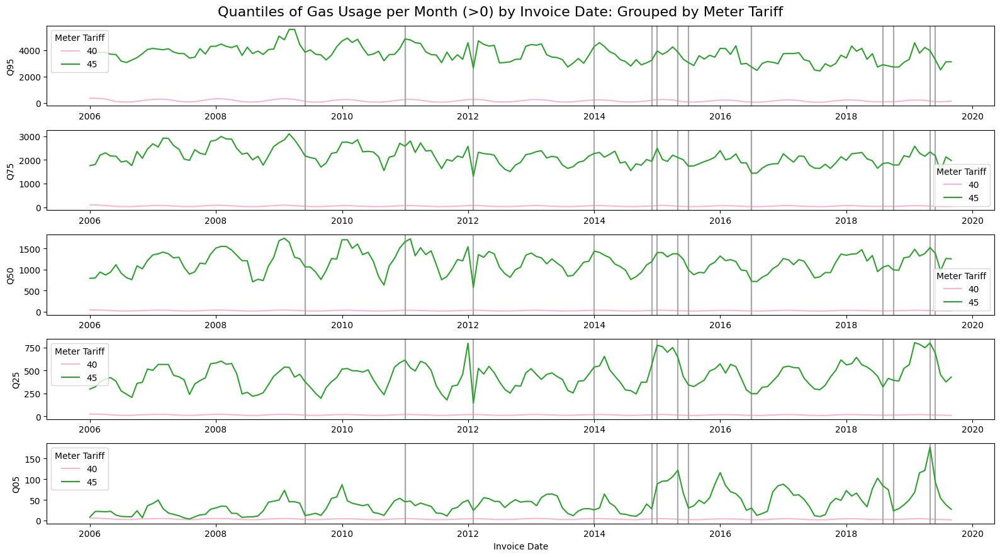

In [107]:
date_mask = '2006-01-01 00:00:00'
mask = (df_temp['monthly_usage'] > 0) & (df_temp['mtr_type'] == 'GAZ') & (df_temp['invoice_date'] >= date_mask) & ((df_temp['mtr_tariff'] == 40) | (df_temp['mtr_tariff'] == 45))
Plot_Metric_Quantiles_Over_Time_Alt_Multi(df_temp[mask], 'mtr_tariff', 'Meter Tariff', 'monthly_usage', 'Gas Usage per Month (>0)', date_mask, date_markers)
mask = (df_temp['mtr_type'] == 'GAZ') & (df_temp['invoice_date'] >= date_mask)
View_Quantiles(df_temp[mask], 'mtr_tariff', 'monthly_usage')

* Conclusions^:
   * MT40 has much, much lower usage than MT45. Its seasonality matches MT45, rising in winter and falling in summer, but is difficult to discern given how low its overall usage is.
   * Very consistent throughout the entire duration, though again, difficult to discern given how low its overall usage is.

^Please note that the sample sizes are very small at so any interpretation should be taken with a pinch of salt

##### Usage versus 'mtr_notes'
The distribution of 'mtr_notes' changed very abruptly in: ~6/2009, ~2/2012, and ~1/2014. The last one affected only electricity usage. Looking to see if these shifts are visible in usage. To simplify, will only look at MT11 for Electricity, and MT40 for Gas. In this case, will *not* be using the per-month usage, but rather the monthly per-invoice usage, and will only look at usage values greater than zero.

In [74]:
df_train.groupby(['mtr_notes'])['client_id'].nunique()

mtr_notes
6    116396
7       477
8     95533
9    116339
Name: client_id, dtype: int64

level_1,0.00,0.02,0.05,0.25,0.50,0.75,0.95,0.98,1.00
mtr_notes,,,,,,,,,
6,0.0,6.0,20.0,74.0,115.0,191.0,586.0,1426.0,56576.0
7,31.0,42.0,58.0,166.0,239.0,294.0,361.0,371.0,378.0
8,0.0,1.0,4.0,40.0,84.0,149.0,357.0,597.0,205272.0
9,0.0,3.0,17.0,101.0,156.0,266.0,1132.0,2566.0,499836.0


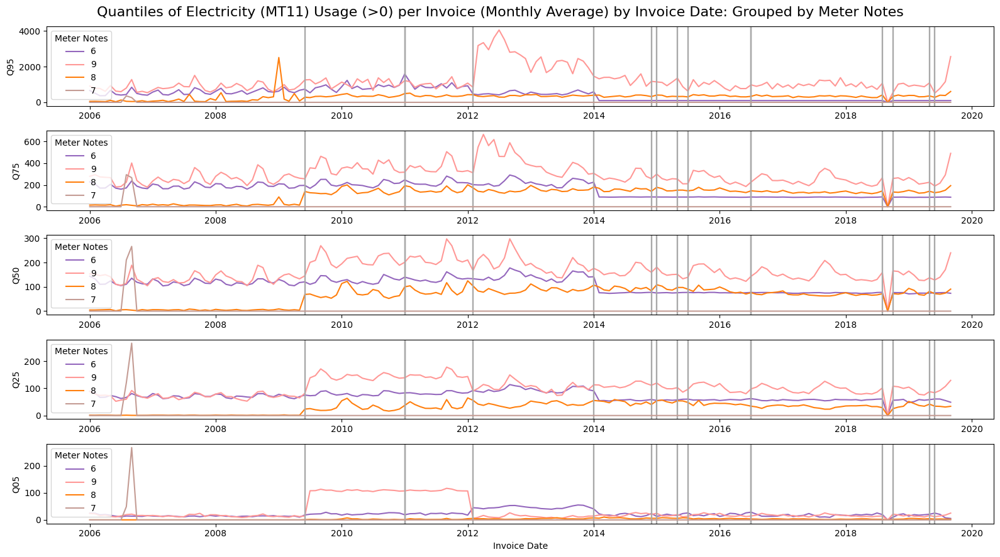

In [108]:
date_mask = '2006-01-01 00:00:00'
mask = (df_train['monthly_usage'] > 0) & (df_train['mtr_tariff'] == 11) & (df_train['invoice_date'] >= date_mask)
Plot_Metric_Quantiles_Over_Time_Alt_Multi(df_train[mask], 'mtr_notes', 'Meter Notes', 'monthly_usage', 'Electricity (MT11) Usage (>0) per Invoice (Monthly Average)', date_mask, date_markers)
View_Quantiles(df_train[mask], 'mtr_notes', 'monthly_usage')

level_1,0.00,0.02,0.05,0.25,0.50,0.75,0.95,0.98,1.00
mtr_notes,,,,,,,,,
6,0.0,2.0,6.0,17.0,28.0,45.0,111.0,230.0,5556.0
7,76.0,76.0,76.0,76.0,76.0,76.0,76.0,76.0,76.0
8,0.0,0.0,2.0,9.0,18.0,29.0,65.0,111.0,4984.0
9,0.0,1.0,3.0,16.0,33.0,102.0,317.0,523.0,9856.0


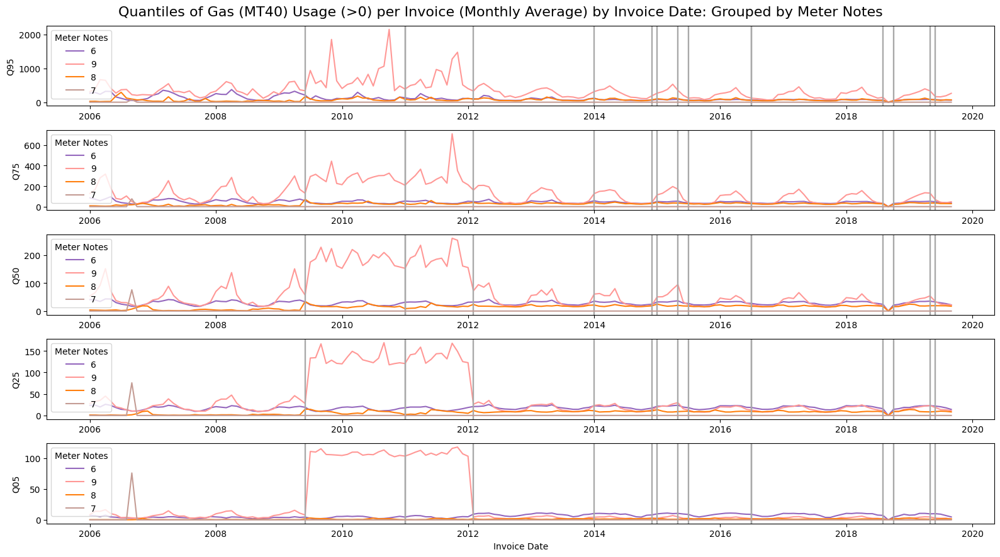

In [111]:
date_mask = '2006-01-01 00:00:00'
mask = (df_train['monthly_usage'] > 0) & (df_train['mtr_tariff'] == 40) & (df_train['invoice_date'] >= date_mask)
Plot_Metric_Quantiles_Over_Time_Alt_Multi(df_train[mask], 'mtr_notes', 'Meter Notes', 'monthly_usage', 'Gas (MT40) Usage (>0) per Invoice (Monthly Average)', date_mask, date_markers)
View_Quantiles(df_train[mask], 'mtr_notes', 'monthly_usage')

Very difficult to summarise given the complex interactions (bear with me!):
* Electricity:
   * Prior ~06/2009:
      * MN6 seems the default.
      * MN7 was very rarely used, and only in ~2007. Here it seemed to signify higher usage, with much higher Q5-Q50 values, though similar Q75 to others, and lower Q95 than others.
      * MN8 was very rarely used, seemed to signify lower usage, with much lower quantiles.
      * MN9 similar to MN6, but with higher upper quantiles (Q75 & 95). Suggesting the higher bracket.
   * ~06/2009+: This was the first spike in the number of MN8. These largely replaced MN6 values over MN9 ones.
      * MN6 usage values remained consistent across this threshold. Still seemingly representing the default.
      * MN7 is no longer used (will not mention it again).
      * MN8 had a very clear jump in usage values, however, still seems to signify lower usage; with its quantiles below others.
      * MN9 usage values very clearly spiked. Though this seemed to affect the lower quantiles more than the higher ones. Still seems to signify higher usage.
      * MN9 seems to have a floor introduced, with its Q05 jumping to ~100, far above the others.
      * MN9 used to have similar Q25 and Q50 to MN6, but after this, it spikes clearly above.
      * MN9 used to have a slightly higher Q75 than MN6, but this gap is increased. 
      * MN9 Q95 seems to remain broadly in line with MN6, and does not noticeably change.
   * ~02/2012+: MN8 once more spikes in numbers. MN9 also began to increase, largely replacing MN6.
      * MN6 inner bands (Q25-Q75) seem largely unchanged, but its Q05 increase significantly, and its Q95 decreases significantly.
      * MN6 Q95 drops from MN9 levels to MN8 levels. MN6 Q05 rises above all others.
      * MN6 still seems to be signify typical usage.
      * MN8 remains largely unchanged, and still seems to signify low usage.
      * MN9 seems to have its Q05 floor removed, and it drops down to MN8 levels.
      * MN9 Q75 and especially Q95 spike dramatically above all others. Its Q95 used to be MN6 but not longer.
      * MN9 Q25 falls back in line with MN6, and its Q50 arguably moves slightly closer to MN6.
      * MN9 still seems to signify high usage.
   * ~01/2014+: MN6 spiked a final time, leaving few MN6.
      * MN6 drops for all quantiles. With an almost cap of <100 (Q95).
      * MN6 now has a very tight distribution across the quantiles, appearing almost constant over time.
      * Role of MN6 no longer clear, its Q50 matches MN8, its Q75 and Q95 is less than MN8, but its Q05 and Q25 are slightly higher than MN8.
      * MN8 remains largely unaffected by this threshold, but due to shifts in MN6, its role is no longer clear.
      * MN9 had its Q75 and Q95 dramatically at start of ~02/2012, but over time, it dropped, by ~01/2014, it is similar to values prior ~02/2012.
      * MN9 Q05-Q50 seem largely unchanged.
      * MN9 still seems to signify high usage.
      * MN9 spikes dramatically after ~06/2019. MN6 doe snot change, and MM8 sees only a modest rise.
* Gas:
   * Prior ~06/2009:
      * MN6 seems the default. Has slight seasonality, peaking in winter.
      * MN7 was very rarely used, and only in ~2007. Here it seemed to signify higher usage, with much higher Q5-Q50 values, though similar Q75 to others, and lower Q95 than others.
      * MN8 was very rarely used, seemed to signify lower usage, with much lower quantiles.
      * MN9 similar to MN6, but with higher upper quantiles (Q75 & 95). MN9 also has higher peaks throughout, in sync with MN8. Suggesting the higher bracket.
   * ~06/2009+: This was the first spike in the number of MN8. These largely replaced MN6 values over MN9 ones.
      * MN6 usage values baselines remained consistent across this threshold. However, its Q75 and Q95 peaks seems to drop. Still seemingly representing the default.
      * MN7 is no longer used (will not mention it again).
      * MN8 had a very clear jump in usage values, however, still seems to signify lower usage; with its quantiles below others.
      * It is difficult to be certain, but it seems that MN8 has slight seasonality that is out of phase with the others; peaking in summers.
      * MN9 usage values very clearly spiked. Unlike with electricity, this seemed to have affected all quantiles. Difficult to discern seasonality anymore.
      * MN9 still seems to signify higher usage.
      * MN9 seems to have a floor introduced, with its Q05 jumping to ~100, far above the others.
      * MN9 used to have similar baselines across the quantiles to MN6, but after this, it spikes clearly above (for both peak and baseline).
   * ~02/2012+: MN8 once more spikes in numbers. MN9 also began to increase, largely replacing MN6.
      * MN6 seems largely unchanged. Perhaps Q05 peaks increased slightly Still seems to be signify typical usage.
      * MN8 remains largely unchanged, and still seems to signify low usage.
      * MN9 seems to largely return to its values prior to ~06/2009, with slightly lower peaks in all quantiles.
      * MN9 still seems to signify high usage.
* Conclusions:
   * Seems clear MN7 and MN9 largely represents higher usage.
   * MN8 seems to represent lower usage. However, post ~01/2014, this is unclear for electricity.
   * Similary, MN6 seems to represent typical usage, but post ~01/2014, this is unclear for electricity.
   * There is a strange spike in electricity usage after 2019 for MN9 that should be explored.
   * Between ~06/2009 and ~02/2012, gas usage in MN9 seems very elevated and should be explored.
   * The same period has an elevated floor for electricity usage for MN9 but does not seem to affect the upper quantiles nearly as much.
   * Instead, between ~02/2012 and ~01/2014, electricity usage in MN9 seems very elevated and should be explored.
   * Though not included, MT10 was also explored. It showed very similar trends, except for this spike in usage ~02/2012.

##### Usage versus 'mtr_status'
Primarily interested in the period between ~02/2012 and ~1/2014. It seemed at MS1 started to grow consistently, before dropping to zero, where it is no longer used. MS5 is no longer used after ~07/2016. Looking to see if these shifts are visible in usage. To simplify, will only look at MT11 for Electricity, and MT40 for Gas. Will ignore MS{2|3|4|A} due to samples sizes. In this case, will *not* be using the per-month usage, but rather the monthly per-invoice usage. In this case, will be looking at all usage values (and not only those greater than zero). This decision is largely arbitrary; decided after inspecting both.

In [88]:
df_train.groupby(['mtr_status'])['client_id'].nunique()

mtr_status
0    134351
1     28249
2        21
3        74
4       606
5     14173
A         1
Name: client_id, dtype: int64

level_1,0.00,0.02,0.05,0.25,0.50,0.75,0.95,0.98,1.00
mtr_status,,,,,,,,,
0,0.0,0.0,0.0,66.0,120.0,204.0,690.0,1653.0,499836.0
1,0.0,0.0,0.0,27.0,94.0,202.0,860.0,1945.0,70761.0
5,-1.0,0.0,0.0,0.0,9.0,113.0,527.0,1079.0,49999.0


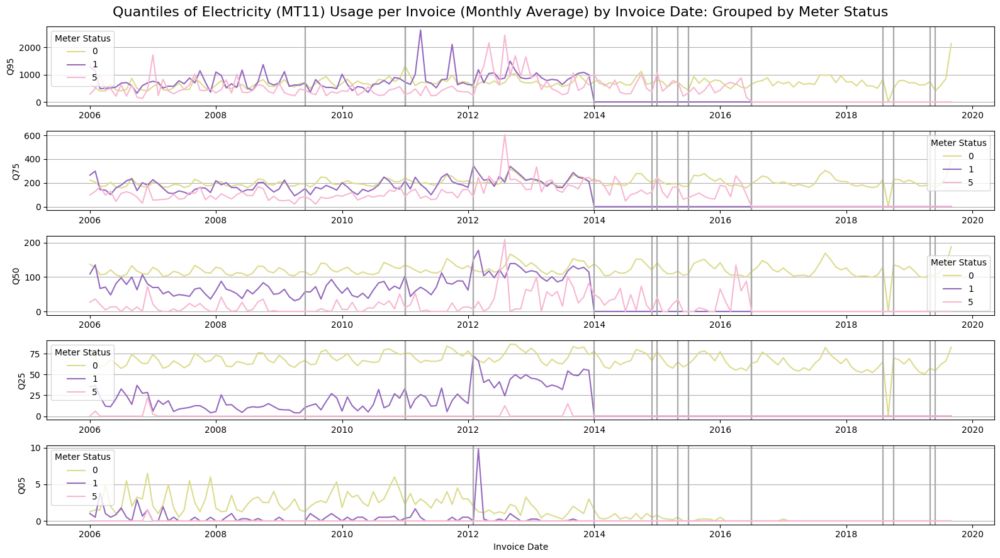

In [109]:
date_mask = '2006-01-01 00:00:00'
mask = (df_train['mtr_tariff'] == 11) & (df_train['invoice_date'] >= date_mask) & (df_train['mtr_status'] != '2') & (df_train['mtr_status'] != '3') & (df_train['mtr_status'] != '4') & (df_train['mtr_status'] != 'A')
Plot_Metric_Quantiles_Over_Time_Alt_Multi(df_train[mask], 'mtr_status', 'Meter Status', 'monthly_usage', 'Electricity (MT11) Usage per Invoice (Monthly Average)', date_mask, date_markers)
View_Quantiles(df_train[mask], 'mtr_status', 'monthly_usage')

level_1,0.00,0.02,0.05,0.25,0.50,0.75,0.95,0.98,1.00
mtr_status,,,,,,,,,
0,0.0,0.0,0.0,9.0,22.0,42.0,171.0,308.0,9856.0
1,0.0,0.0,0.0,3.0,16.0,34.0,183.0,363.0,5192.0
5,0.0,0.0,0.0,0.0,0.0,0.0,62.0,206.0,5556.0


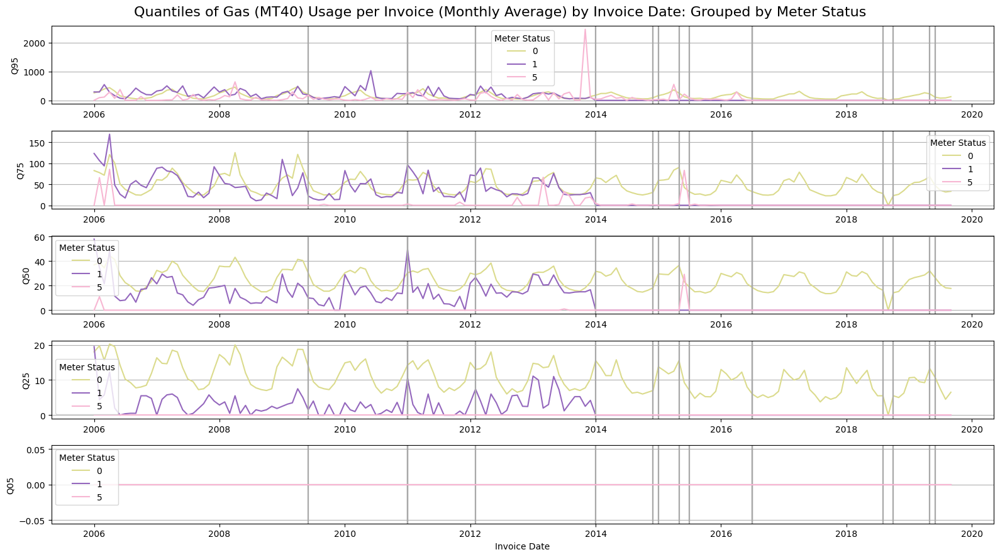

In [112]:
date_mask = '2006-01-01 00:00:00'
mask =  (df_train['mtr_tariff'] == 40) & (df_train['invoice_date'] >= date_mask) & (df_train['mtr_status'] != '2') & (df_train['mtr_status'] != '3') & (df_train['mtr_status'] != '4') & (df_train['mtr_status'] != 'A')
Plot_Metric_Quantiles_Over_Time_Alt_Multi(df_train[mask], 'mtr_status', 'Meter Status', 'monthly_usage', 'Gas (MT40) Usage per Invoice (Monthly Average)', date_mask, date_markers)
View_Quantiles(df_train[mask], 'mtr_status', 'monthly_usage')

Interested only between ~02/2012 to ~01/2014 as sample sizes prior will be too small:
* Electricity (MT11):
   * MS0 is by far the most common. Sees no change throughout the period.
   * MS1 sees a spike post ~02/2012 in the lower quantiles to approach MS0 levels. Ends after ~01/2014.
   * MS0 has far more zeros, affecting up to its Q50. It also spikes post ~02/2012. For 2013, has Q95 above MS0, but soons fall back down. Ends after ~07/2016.
* Gas (MT40):
   * MS0 is by far the most common. Sees gradual and slight decline over time.
   * MS1 sees a spike post ~02/2012 in the lower quantiles to approach MS0 levels. Ends after ~01/2014.
   * MS0 has far more zeros, affecting up to its Q75. 
   * MS0 maybe has slight spike between ~02/2012 and ~01/2014 in Q75. Also maybe another spike ~05/2015, during 9-day period of low invoices.
   * Too few MS0 samples to be convincing.
* Conclusions:
   * Unconvinced there is anything here.

##### Usage versus 'mtr_code'
There are too many to explore them all. However, almost all of MT10 is MC202 whereas almost none of MT11 has MC202. MT11 is dominated by MC203, MC207, and MC413. For gas, almost all are MC10, with MC5 being the only other significant category. Therefore, will look solely at these. Will look at per-invoice and will include all usage values.

In [147]:
df_train.groupby(['mtr_type', 'mtr_code'])['client_id'].nunique()

mtr_type  mtr_code
ELEC      101            31
          102           103
          201           513
          202         15827
          203         62266
          204           868
          207         33503
          210            72
          214           247
          222             7
          227             4
          303             2
          305            14
          307            22
          310            17
          317             6
          325             1
          333             1
          367             1
          403            77
          407           676
          410          3376
          413         19021
          420          5866
          433          1716
          442           800
          450            45
          453           324
          467           292
          483           108
          506           113
          532            54
          565            32
          600            27
GAZ       5           60481
 

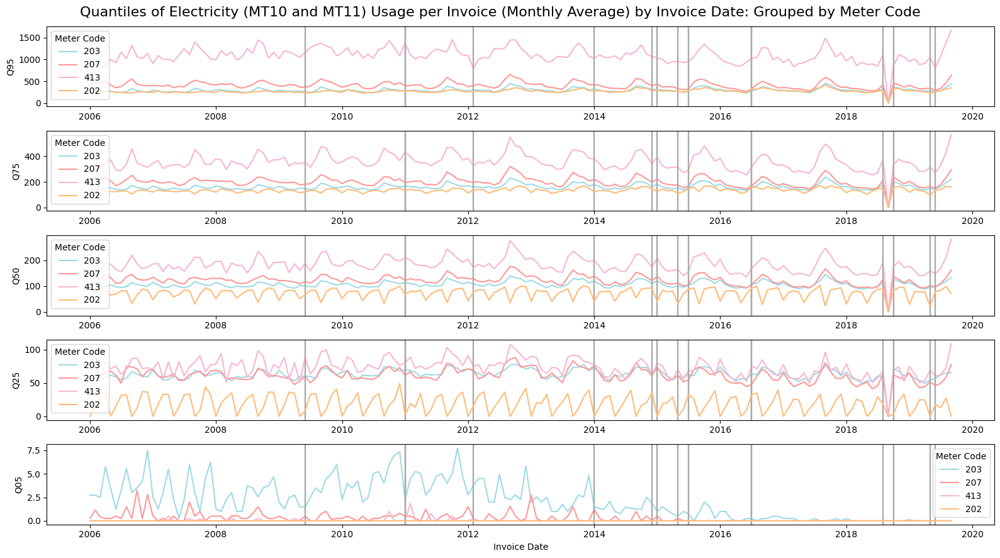

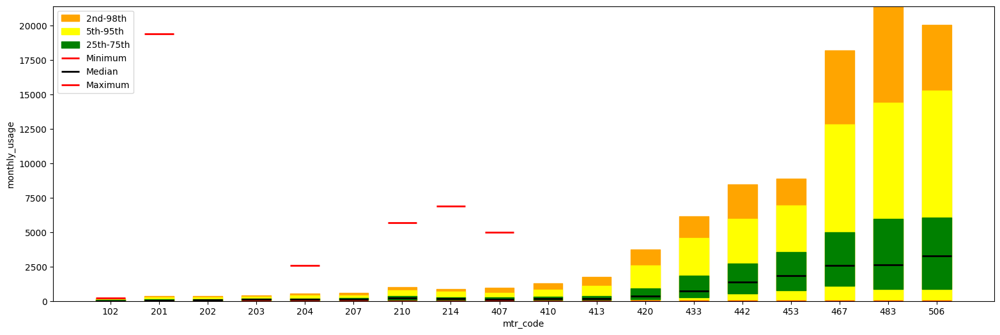

In [146]:
date_mask = '2006-01-01 00:00:00'
mask = (df_train['invoice_date'] >= date_mask) & ((df_train['mtr_code'] == 202) | (df_train['mtr_code'] == 203) | (df_train['mtr_code'] == 207) | (df_train['mtr_code'] == 413)) # 202 is basically MT10, and the rest are MT11
Plot_Metric_Quantiles_Over_Time_Alt_Multi(df_train[mask], 'mtr_code', 'Meter Code', 'monthly_usage', 'Electricity (MT10 and MT11) Usage per Invoice (Monthly Average)', date_mask, date_markers)
mask = ((df_train['invoice_date'] >= date_mask) & (df_train['mtr_type'] == 'ELEC') & 
        (df_train['mtr_code'] != 16) & (df_train['mtr_code'] != 40) & (df_train['mtr_code'] != 65) & (df_train['mtr_code'] != 101) & (df_train['mtr_code'] != 2010) &
        (df_train['mtr_code'] != 222) & (df_train['mtr_code'] != 227) & (df_train['mtr_code'] != 303) & (df_train['mtr_code'] != 305) & (df_train['mtr_code'] != 307) &
        (df_train['mtr_code'] != 310) & (df_train['mtr_code'] != 317) & (df_train['mtr_code'] != 325) & (df_train['mtr_code'] != 333) & (df_train['mtr_code'] != 367) &
        (df_train['mtr_code'] != 403) & (df_train['mtr_code'] != 450) & (df_train['mtr_code'] != 532) & (df_train['mtr_code'] != 565) & (df_train['mtr_code'] != 600)) # Keep those with triple digits or higher only
Plot_Quantiles(df_train[mask], 'mtr_code', 'monthly_usage')

level_1,0.00,0.02,0.05,0.25,0.50,0.75,0.95,0.98,1.00
mtr_code,,,,,,,,,
5,0.0,0.0,0.0,9.0,22.0,41.0,153.0,261.0,9856.0
10,0.0,0.0,0.0,16.0,120.0,374.0,1225.0,1733.0,7200.0


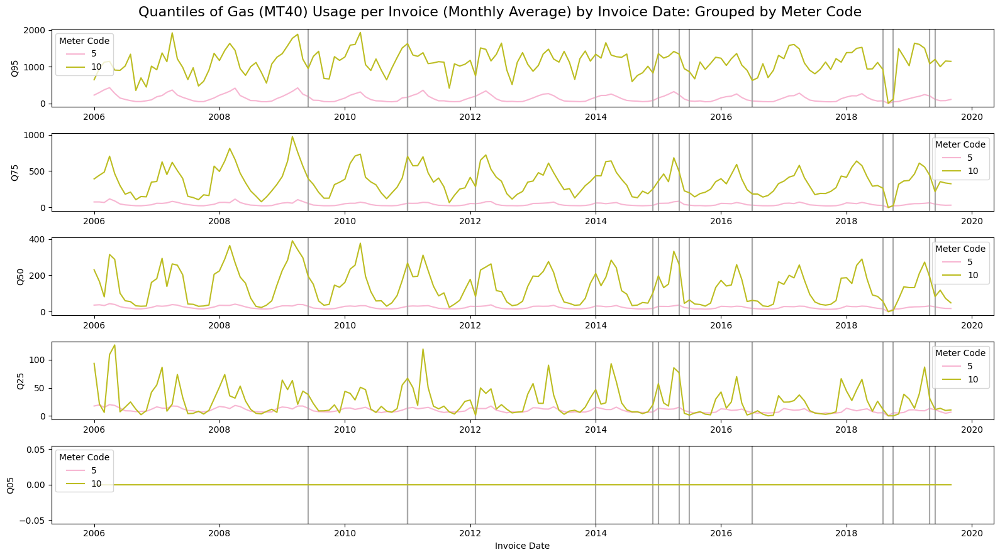

In [219]:
date_mask = '2006-01-01 00:00:00'
mask = (df_train['mtr_tariff'] == 40) & (df_train['invoice_date'] >= date_mask) & ((df_train['mtr_code'] == 5) | (df_train['mtr_code'] == 10))
Plot_Metric_Quantiles_Over_Time_Alt_Multi(df_train[mask], 'mtr_code', 'Meter Code', 'monthly_usage', 'Gas (MT40) Usage per Invoice (Monthly Average)', date_mask, date_markers)
mask = (df_train['mtr_tariff'] == 40) & (df_train['invoice_date'] >= date_mask) & (df_train['mtr_code'] != 16) & (df_train['mtr_code'] != 40) & (df_train['mtr_code'] != 65) # Keep only those with triple digit counts
View_Quantiles(df_train[mask], 'mtr_code', 'monthly_usage')

* Electricity:
   * MT10 is almost entirely MC202 whereas MT11 has almost no MC202. Over time, the number of MC207 grows as MC203 shrinks. 
   * MC202 seems to have more rapid seasonality. It is also consistently less than the others. Although it approach MC203 as the quantiles increase.
   * Initially, MC207 seems higher than MC203, looking at Q50-Q95. After ~2015, they seem to converge.
   * MC413 clearly has the highest usage consistently.
* Gas:
   * MC10 dwarfs MC5 in volume. 
   * MC5 seems quite consistent, and much lower than MC10.
* Conclusions:
   * Unfortunately, it seems 'mtr_code' has strong influence on expected usage, with MC413 being clearly much higher than the rest.
   * Potentially dubious, but seems there is a positive relationship between expected usage and 'mtr_code' value.
   * Pure conjecture, but going to assume that this is some form of clustering where meters are grouped together based on expected behaviour.
   * A given meter rarely changes 'mtr_code' values in contrast to 'mtr_status' and 'mtr_notes'.

##### Usage versus 'fraud'
This is of course very interesting, but will be covered in more detail in the _____. Here, will only look at MT11 representing electricity, and MT40 representing gas. It was previously shown that very accounts flagged as fraudulent were closed prior 2012, and very few were opened after 2017.

In [150]:
df_train.groupby(['mtr_type', 'fraud'])['client_id'].nunique()

mtr_type  fraud
ELEC      0.0      127255
          1.0        7560
GAZ       0.0       57607
          1.0        4447
Name: client_id, dtype: int64

level_1,0.00,0.02,0.05,0.25,0.50,0.75,0.95,0.98,1.00
fraud,,,,,,,,,
0.0,-1.0,0.0,0.0,65.0,118.0,200.0,637.0,1510.0,499836.0
1.0,0.0,0.0,1.0,66.0,128.0,258.0,1417.0,2853.0,116645.0


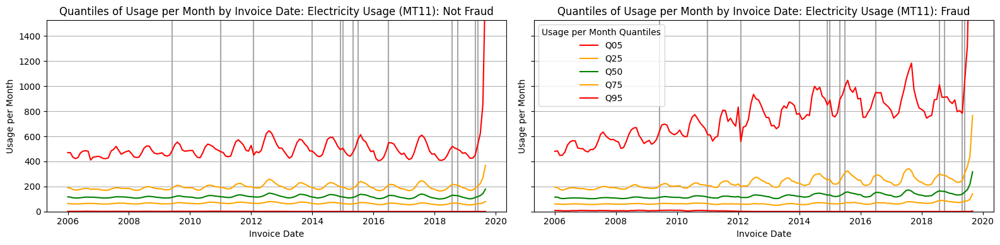

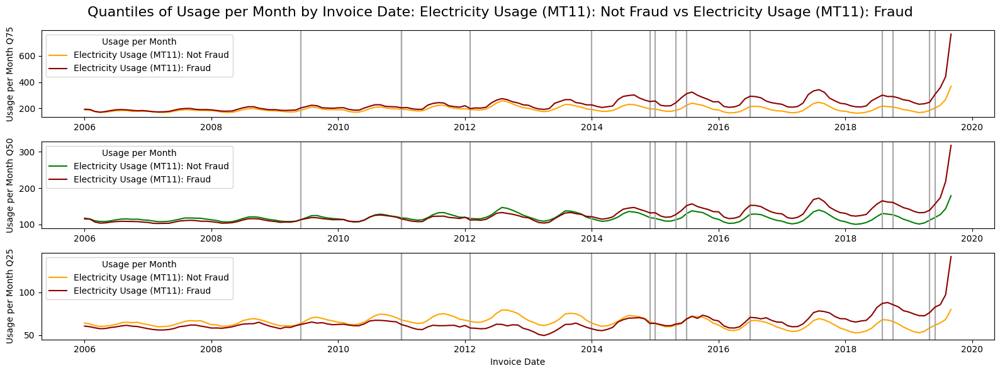

In [ ]:
date_mask = '2006-01-01 00:00:00'
mask_left = (df_temp['mtr_tariff'] == 11) & (df_temp['fraud'] == 0)
mask_right = (df_temp['mtr_tariff'] == 11) & (df_temp['fraud'] == 1)
Plot_Metric_Quantiles_Over_Time(df_temp, mask_left, mask_right, "Electricity Usage (MT11): Not Fraud", "Electricity Usage (MT11): Fraud", 'monthly_usage', 'Usage per Month', None, 3, date_mask, date_markers)
Plot_Metric_Quantiles_Over_Time_Alt(df_temp, mask_left, mask_right, "Electricity Usage (MT11): Not Fraud", "Electricity Usage (MT11): Fraud", 'monthly_usage', 'Usage per Month', date_mask, date_markers)
View_Quantiles(df_train[(df_train['mtr_tariff'] == 11)], 'fraud', 'monthly_usage')

level_1,0.00,0.02,0.05,0.25,0.50,0.75,0.95,0.98,1.00
fraud,,,,,,,,,
0.0,0.0,0.0,0.0,9.0,22.0,42.0,164.0,291.0,9856.0
1.0,0.0,0.0,0.0,12.0,25.0,50.0,261.0,517.0,7200.0


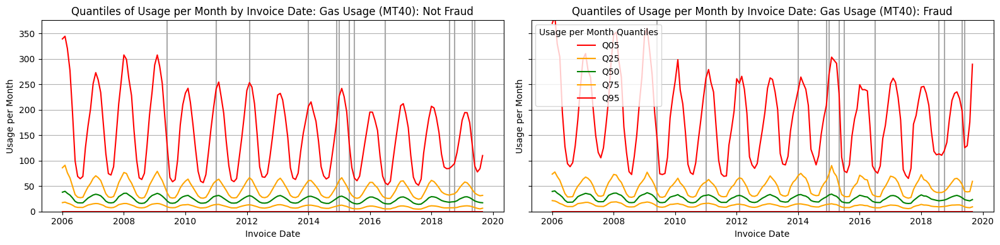

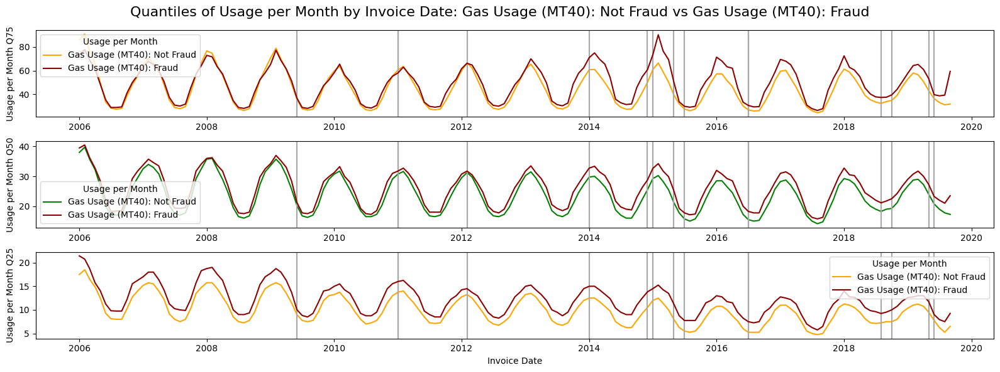

In [ ]:
date_mask = '2006-01-01 00:00:00'
mask_left = (df_temp['mtr_tariff'] == 40) & (df_temp['fraud'] == 0)
mask_right = (df_temp['mtr_tariff'] == 40) & (df_temp['fraud'] == 1)
Plot_Metric_Quantiles_Over_Time(df_temp, mask_left, mask_right, "Gas Usage (MT40): Not Fraud", "Gas Usage (MT40): Fraud", 'monthly_usage', 'Usage per Month', None, 3, date_mask, date_markers)
Plot_Metric_Quantiles_Over_Time_Alt(df_temp, mask_left, mask_right, "Gas Usage (MT40): Not Fraud", "Gas Usage (MT40): Fraud", 'monthly_usage', 'Usage per Month', date_mask, date_markers)
View_Quantiles(df_train[(df_train['mtr_tariff'] == 40)], 'fraud', 'monthly_usage')

* Electricity (MT11):
   * Q95 consistantly rising for fraud whereas more constant for non-fraud. Interestingly, both spike very high after 2019.
   * For Q25-Q75, fraud usage gradually overtakes non-fraud, though at different times:
       * For Q75, seems to overtake ~2013.
       * For Q50, seems to overtake ~2014.
       * For Q25, seems to overtake ~2015. Between ~06/2010 and ~06/2014, fraud usage seemed to noticeably dip below non-fraud usage.
* Gas (MT40):
   * Q95 generally falling for both fraud and non-fraud. Baseline values for fraud seem more erratic.
   * For Q25, fraud usage consistently higher than non-fraud throughout.
   * For Q50-Q75, fraud usage gradually overtakes non-fraud, though at different times:
       * For Q75, seems to overtake ~2013.
       * For Q50, seems to overtake ~2013. Although unclear, since it was consistently above non-fraud throughout.
* Conclusions:
   * Very interesting but difficult to interpret.
   * Seems like ~2013 marks a divergance in usage, based primarily on Q75.
   * Seems like fraud is indicated by higher usage.

It is again noted, it is not known *when* an account was flagged as fraud, so it could be entirely the opposite. Those that had previously lower usage, that then reported higher usage, may be flagged. For example, if security was improved over time, then those under-reporting would gradually begin reporting real values. Quite frustrating to not know even this basic aspect! 

##### Conclusions
* Client Type:
   * CT51 dwarfs CT11 and CT12 in usage.
   * CT51 has a strange dip in electricity usage ~02/2012 that should be investigated.
   * Perhaps CT12 is either more seasonal in terms of climate, or has more tourism, to drive the higher variability.
   * CT51 is clearly more commericial or industrial given its much higher usage.
* District:
   * All relatively evenly sized.
   * D69 seems to have consistently higher usage.
   * D69 has strange bump in electricity usage ~2010 not seen in the others that should be investigated..
   * D63 seems much less seasonal in its gas usage than the others. Similarly, its overall distribution is much tighter than the others (smaller Q75 and Q95).
   * Perhaps D69 has the most seasonal climate and D63 the least.
* Meter Tariff:
   * MT11 is consistently higher than MT10 with a very consistent delta between them over time. This only is broken after 2019, where MT11 spikes very sharply.
   * MT11 has a strange spike in electricity usage ~06/2019 that should be investigated.
   * Perhaps MT15 was used for heating given its seasonality matches gas moreso than electricity. Just conjecture. Seems to be phased out over time.
   * MT9 may be a subsidised tariff given these characteristics: consistent usage and introduced after political unrest (~01/2011).
   * MT29 seems very consistent with almost no seasonality visible.
   * MT13 and MT14 are quite similar, with MT13 seeming to have slightly higher usage throughout.
   * MT12 initially has much higher usage than the rest before ~2007 but quickly drops the lowest usage.
   * MT40 (G) has much, much lower usage than MT45 (G). Its seasonality matches MT45, rising in winter and falling in summer, but is difficult to discern given how low its overall usage is.
   * The specific 'mtr_tariff' value does not seem to have a particular significance; i.e., would not necessarily know expected usage without prior knowledge. 
* Meter Notes:
   * Very complicated, better to read conclusions from the section directly.
   * Seems clear MN7 and MN9 largely represents higher usage.
   * MN8 seems to represent lower usage. However, post ~01/2014, this is unclear for electricity.
   * Similary, MN6 seems to represent typical usage, but post ~01/2014, this is unclear for electricity.
   * There is a strange spike in electricity usage after 2019 for MN9 that should be explored.
   * Between ~06/2009 and ~02/2012, gas usage in MN9 seems very elevated and should be explored.
   * Between ~02/2012 and ~01/2014, electricity usage in MN9 seems very elevated and should be explored.
   * Though not included, MT10 (E) was also explored. It showed very similar trends to MT11 (E), except for this spike in usage ~02/2012.
* Meter Status:
   * MS0 is by for that most common.
   * Nothing convincing in relation to usage. 
* Meter Code:
   * Unclear relationships.
   * Seems like its value positively correlated with expected usage.
* Fraud:
   * Unclear relationships.
   * Seems like fraud is indicated by higher usage.
   * Seems like ~2013 marks a divergance in usage between fraud and non-fraud, based primarily on Q75. Fraud increased above non-fraud.

### Feature Interactions:

The number of permutations can quickly explode in size if not careful. Interesting specifically in the following:
* The extent of overlap between District and Region.
* Further analysis on potential significance of 'mtr_status'.

Unfortunately, out of time, but would have liked to have also looked at:
* Further analysis on potential significance of 'mtr_code'.
* Further analysis on 'mtr_notes' given it was stated to be manually labelled.

#### District and Region:
Looking simply to reduce the number of permutations considered.

<Axes: xlabel='region', ylabel='count'>

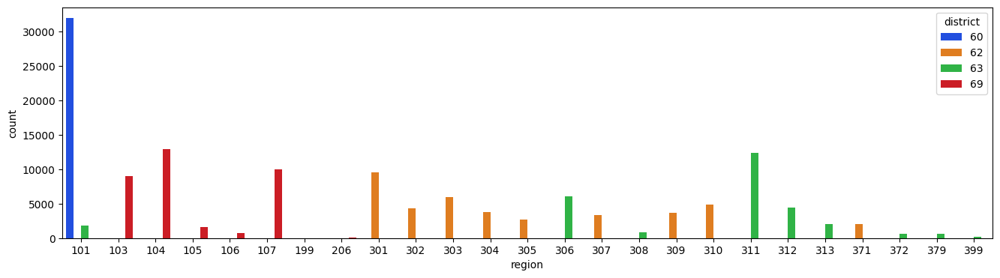

In [169]:
# Comparing District and Region
df_temp = df_train.groupby(['district', 'region']).agg(count=('client_id','nunique')).sort_index().reset_index()
df_temp = pd.merge(df_temp, df_train.groupby(['district']).agg(count=('client_id','nunique')).sort_index().reset_index(), on='district')
df_temp['count_grp'] = (df_temp['count_x'].div(df_temp['count_y'])*100).round(1)
df_temp['count_pop'] = (df_temp['count_x'].div(df_train['client_id'].nunique())*100).round(1)
df_temp = df_temp.rename(columns={"count_x":"count", "count_y":"district_count", "count_grp":"%_of_district", "count_pop":"%_of_pop"})
plt.figure(figsize=(16, 4))
sns.barplot(data=df_temp, x='region', hue='district', y='count', palette='bright')

* R106, R199, R206, R308, R372, R379, and R399 seem too small.
* R101 (D63), R105, R313, and E371 are also potentially too small.
* Only R101, R305, R308 and R399 appear in multiple Districts.
   * R101: 95% vs 5% are in D60 vs D63, constituting ~100% vs ~6% of each District.  
   * R305: 100% vs 0% are in D62 vs D63, constituting ~7% vs ~0% of each District.
   * R308: 99% vs 1% are in D63 vs D62, constituting ~3% vs ~0% of each District.
   * R399: 99% vs 1% are in D63 vs D62, constituting ~1% vs ~0% of each District.
* Potentially R101 is intentional, the rest are assumed as erroneous.

#### Meter Status:
Did not have a clear link to usage, going to explore a bit further to try and gain an understanding of its significance.

In [170]:
df_train['mtr_status'].value_counts()

mtr_status
0    4275652
1      59529
5      16420
4       2707
3        258
2         27
A          1
Name: count, dtype: int64

MS{A|2|3|4} are going to be ignored given their small sample size. Starting with MS5:

In [171]:
# How many times did a grp have mtr_status 5 then something not that after?
mask = (df_train['mtr_status'] == "5") & (df_train['usage_N'] > 0)
df_train['temp_1'] = mask
df_train['temp_1'] = df_train.groupby(grp_cols+['mtr_code'], observed=True)['temp_1'].transform('cummax')
mask_2 = (df_train['mtr_status'] == "5") & (df_train['usage_N'] == 0)
df_train['temp_2'] = mask
df_train['temp_2'] = df_train.groupby(grp_cols+['mtr_code'], observed=True)['temp_2'].transform('cummax')
print(f"Instances of when MS5 and 'usage_N' > 0 ended an account / did not end an account: {sum(mask&(df_train['temp_1']==True))} / {sum(mask&(df_train['temp_1']==False))}.")
print(f"Instances of when MS5 and 'usage_N' == 0 ended an account / did not end an account: {sum(mask_2&(df_train['temp_2']==True))} / {sum(mask_2&(df_train['temp_2']==False))}.")

Instances of when MS5 and 'usage_N' > 0 ended an account / did not end an account: 7041 / 0.
Instances of when MS5 and 'usage_N' == 0 ended an account/ did not end an account: 9 / 9369.


Based on the above, and a little bit of additiona data inspection, the following is assumed:
* MS0: "typical":
    * Business as usual, by far the most common value.
* MS5: "change":
    * If 'usage_N' > 0: "halting":
       * This most commonly extends to "closing": 
       * This can involve reusing same 'mtr_id' but having different 'mtr_code' or 'mtr_tariff'. 
       * More often, it is different 'mtr_id'.
    * If 'usage_N' == 0: "pausing":
       * Rarely, the exact same meter is restarted at a later point in time.
* MS1: "resuming":
    * This is less reliable and I am unconvinced of this interpretation.
    * Seems to mark start of equivalent of what above marks the end of. 
    * Seen cases, where it repeats numerous times though.
* 'mtr_status' == {2|3|4|A}: "unknown"/"unexplored":
    * These are too rare to invest time into exploring.
    * They have no obvious direct link to fraud though.

If this were ideal, then when looking chronologically, would want end of any grouping to be marked by a 5, and the start of every new one, marked by a 1. Though is commonly the case, it is not always so. Particularly regarding the lack of 1. Importantly, this also does not help explain why there was a trend of growing amounts of 1 prior to the shift in tariff, before it sharply dropping after it. It would have been expected for them to have been paired with similarly growing amounts of 5 as accounts were shifted over, but it did not.

#### Meter Code and Client Type:
It was seen earlier that usage had a loose relationship with 'mtr_code'; going to corroborating this against 'client_type':
* CT51 has much higher usage, and CT12 had higher upper ends than CT11. 
* Would therefore expect this to be reflected in allocation of 'mtr_code'.

Text(0.5, 1.0, 'Proportion of Meter Code Value in each Client Type')

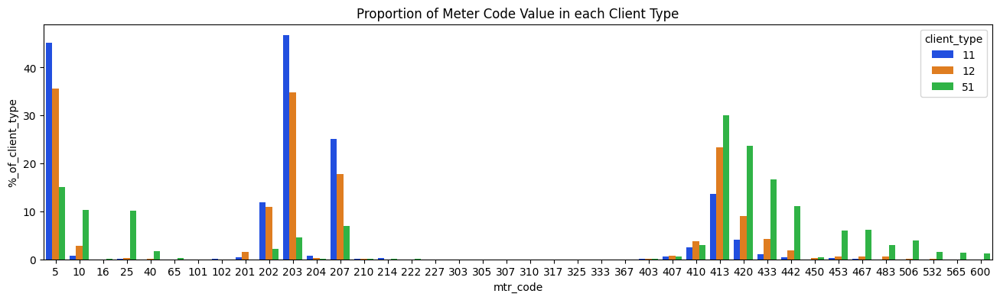

In [ ]:
# Looking at MT11 first, then MT40:
df_temp = df_train.groupby(['client_type', 'mtr_code']).agg(count=('client_id','nunique')).sort_index().reset_index()
df_temp = pd.merge(df_temp, df_train.groupby(['client_type']).agg(count=('client_id','nunique')).sort_index().reset_index(), on='client_type')
df_temp['count_grp'] = (df_temp['count_x'].div(df_temp['count_y'])*100).round(1)
df_temp['count_pop'] = (df_temp['count_x'].div(df_train['client_id'].nunique())*100).round(1)
df_temp = df_temp.rename(columns={"count_x":"count", "count_y":"client_type_count", "count_grp":"%_of_client_type", "count_pop":"%_of_pop"})
plt.figure(figsize=(16, 4))
sns.barplot(data=df_temp, x='mtr_code', hue='client_type', y='%_of_client_type', palette='bright').set_title("Proportion of Meter Code Value in each Client Type")

It clearly seems as 'client_type' increases, the poportion of higher 'mtr_code' values also increase. This relationship persists even if looking at MT11 (E) or MT40 (G) independently. As both 'client_type' and 'mtr_code' seemed linked to usage, it is not clear which is driving the relationship.

#### Meter Tariff:
Although energy usage seemed to differ across 'mtr_tariff' values, there was no discernable relationship in regards to what a specific 'mtr_tariff' might mean. Here, more interested in a simplified look into when a given 'mtr_tariff' was introduced / discontinued. Reminder that 'mtr_tariff' >= 30 is related to gas, and those under are for electricity.

In [28]:
df_train['mtr_tariff'].value_counts()

mtr_tariff
11    2649250
40    1300100
10     274947
15      70868
45      17300
13      11059
14      10700
29       9681
9        5829
12       4721
21         95
30         29
24          9
18          4
42          1
27          1
Name: count, dtype: int64

Q00         Q05         Q25         Q50  \
mtr_type mtr_tariff                                                   
ELEC     9           2011-05-17  2013-10-02  2015-10-29  2017-04-03   
         10          1977-06-16  2006-03-06  2008-11-21  2012-03-16   
         11          1977-09-12  2006-07-21  2009-11-05  2013-06-04   
         12          2006-01-24  2008-10-08  2011-11-02  2014-09-10   
         13          1982-04-30  2006-03-27  2009-07-08  2012-11-05   
         14          1982-04-30  2006-03-27  2009-07-30  2012-11-27   
         15          1980-04-17  2006-01-17  2008-05-02  2011-06-07   
         29          1979-07-06  2006-01-19  2008-09-18  2012-01-09   
GAZ      40          1981-09-01  2007-02-12  2010-12-21  2014-04-16   
         45          2000-10-30  2007-07-03  2010-12-02  2014-03-04   

                            Q75         Q95        Q100  
mtr_type mtr_tariff                                      
ELEC     9           2018-05-24  2019-06-26  2019-09-11  
         10          2015-10-22  2018-11-27  2019-09-11  
         11          2016-08-30  2019-01-29  2019-09-11  
         12          2017-04-13  2019-03-01  2019-09-11  
         13          2016-04-16  2018-12-24  2019-09-11  
         14          2016-04-18  2018-12-18  2019-09-11  
         15          2015-03-12  2018-07-24  2019-09-11  
         29          2015-08-14  2018-08-16  2019-09-11  
GAZ      40          2017-01-13  2019-02-13  2019-09-11  
         45          2016-12-02  2019-02-04  2019-09-11

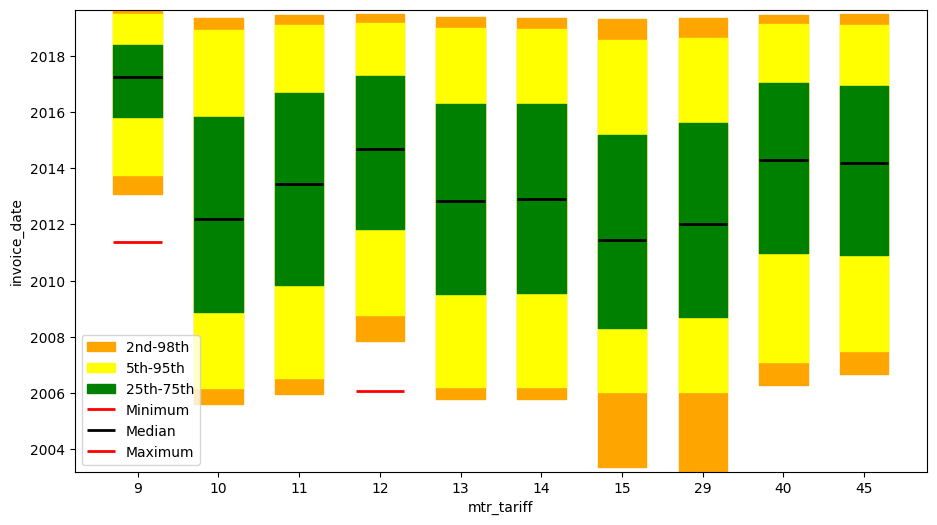

In [38]:
mask = ((df_train['mtr_tariff'] != 21) & (df_train['mtr_tariff'] != 30) & (df_train['mtr_tariff'] != 24) & 
        (df_train['mtr_tariff'] != 18) & (df_train['mtr_tariff'] != 42) & (df_train['mtr_tariff'] != 27)) # Too rare 
Plot_Quantiles(df_train[mask], 'mtr_tariff', 'invoice_date')
df_temp = df_train[mask].groupby(['mtr_type', 'mtr_tariff'])['invoice_date'].quantile([0.00, 0.05, 0.25, 0.5, 0.75, 0.95, 1.00]).unstack()
df_temp.columns = ['Q00', 'Q05', 'Q25', 'Q50', 'Q75', 'Q95', 'Q100']
for col_name in df_temp.columns:
    df_temp[col_name] = df_temp[col_name].dt.date
df_temp

* MT{21|30|24|18|42|27} are all too seldomly used to be reliably assessed and are excluded.
* Should note that prior 2006, the overall volumes in invoices were much lower. This will effect the quantiles.
* MT9 begins relatively late; starting ~05/2011.
* MT12 also begins a bit later than the rest; starting ~01/2006.

Should be noted, attempted the same thing for 'mtr_code', looking at MT10 (E), MT11 (E), MT40 (G), and MT45 (G) each independently. However, there was nothing interesting to report, so omitted.

## Conclusion

### Next Steps:
There is, of course, way too much to consider in the time I have available, and too much covered to summarise comprehensively here. The EDA enabled me to understand the general relationships between the fields and thus their intended interpretations. This allowed me to identify and even correct instances of data corruption and/or data inconsistencies. This is not to say I have a full understanding of all aspects and/or fields: 'mtr_tariff', 'mtr_status', 'mtr_code', and 'mtr_notes' still seem rather vague. If they were missing for a random record, I do not think I could consistently predict them (barring using imputation and trends etc.). To be honest, it is easy to overlook the challenge associated with determining the relationship(s) between the fields and records given how poorly they were documented and the presence of data quality issues. Can compare to understanding gleaned by others inspecting this same dataset to see it was not obvious.

Anyway, there is now sufficient understanding to allow for clear plotting of relevant metrics for inspection, in aggregate and per-client form. Equipped with this, the next step is to determine how best to represent a given 'client_id' in tabular form for fraud detection. In tandem to this, further work is needed to identify key indicators of fraud in order to know what must be kept, and what can be discarded. This will be done in the ____ notebook. Will conclude this notebook with some of the key findings in their condensed forms. Please refer to the relevant sections for further details.

### Key Findings:
* ????

